# <u>Breast Cancer Classification<u>

#### Overview

Breast cancer is a kind of cancer that begins as a growth of cells in the breast tissue.

After skin cancer, breast cancer is the most common cancer diagnosed in women in the United States. But breast cancer doesn't just happen in women. Everyone is born with some breast tissue, so anyone can get breast cancer.

Breast cancer survival rates have been increasing. And the number of people dying of breast cancer is steadily going down. Much of this is due to the widespread support for breast cancer awareness and funding for research.

Advances in breast cancer screening allow healthcare professionals to diagnose breast cancer earlier. Finding the cancer earlier makes it much more likely that the cancer can be cured. Even when breast cancer can't be cured, many treatments exist to extend life. New discoveries in breast cancer research are helping healthcare professionals choose the most effective treatment plans
[link](https://www.mayoclinic.org/diseases-conditions/breast-cancer/symptoms-causes/syc-20352470)

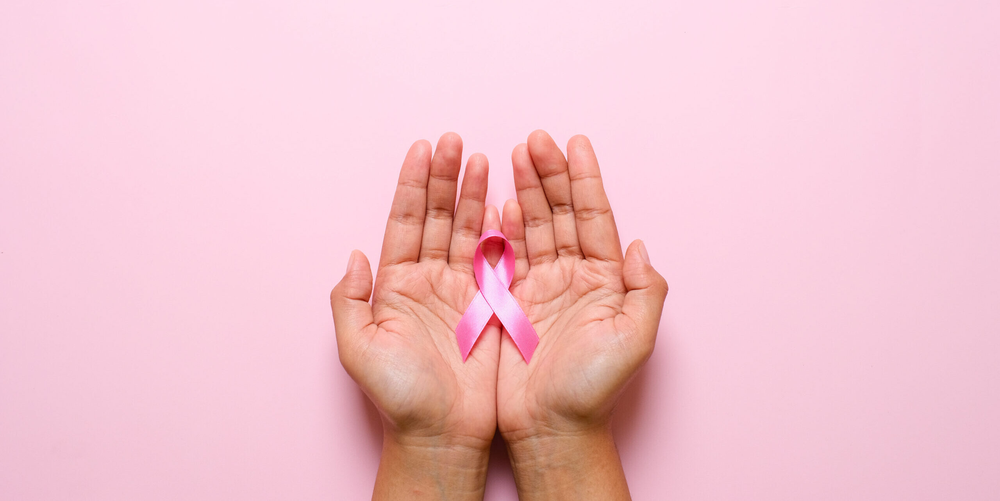



**There are two types of breast cancer tumors: those that are non-cancerous, or ‘benign’, and those that are cancerous, which are ‘malignant’.**

### Benign Tumors
[link](https://my.clevelandclinic.org/health/diseases/22121-benign-tumor)

When a tumor is diagnosed as benign, doctors will usually leave it alone rather than remove it. Even though these tumors are not generally aggressive toward surrounding tissue, occasionally they may continue to grow, pressing on other tissue and causing pain or other problems. In these situations, the tumor is removed, allowing pain or complications to subside.

### Malignant tumors
Malignant tumors are cancerous and may be aggressive because they invade and damage surrounding tissue. When a tumor is suspected to be malignant, the doctor will perform a biopsy to determine the severity or aggressiveness of the tumor.

**Breast Cancer Prediction Model**

Breast cancer prediction involves developing a model to predict whether a breast cancer diagnosis is benign or malignant based on various features of the patient and tumor characteristics. Using the breast-cancer-dataset.csv file, we can build a machine learning model for this purpose.

**Dataset Overview**

Source:
Available via UW CS ftp server: ftp://ftp.cs.wisc.edu/math-prog/cpo-dataset/machine-learn/WDBC/
UCI Machine Learning Repository: Breast Cancer Wisconsin (Diagnostic) Dataset

**Description**:
Features computed from digitized FNA images of breast masses, describing characteristics of cell nuclei.
Based on 3-dimensional space described in: K. P. Bennett and O. L. Mangasarian (1992).


**Attribute Information**:
- ID number
- Diagnosis (M = malignant, B = benign)
- Ten real-valued features are computed for each cell nucleus:
- radius (mean of distances from center to points on the perimeter)
- texture (standard deviation of gray-scale values)
- perimeter
- area
- smoothness (local variation in radius lengths)
- compactness (perimeter^2 / area - 1.0)
- concavity (severity of concave portions of the contour)
- concave points (number of concave portions of the contour)
- symmetry
- fractal dimension ("coastline approximation" - 1)

Feature Values: Recoded with four significant digits.
Missing Attribute Values: None reported.

Class Distribution:
- 357 benign cases
- 212 malignant cases

#### Steps to Build the Prediction Model:
**1-Data Preprocessing:**
-Handle categorical variables (e.g., Breast, Breast Quadrant, Diagnosis Result).
-Normalize or scale numerical variables if necessary.
-Split the data into training and testing sets.

**2-Feature Selection:**
Select relevant features that contribute most to the prediction.
Consider using techniques like correlation analysis or feature importance from tree-based models.

**3-Model Selection:**
-Choose appropriate machine learning algorithms (e.g., Logistic Regression, Decision Tree, Random Forest, Support Vector Machine).
-Train multiple models and compare their performance.

**4-Model Training and Evaluation:**
-Train the selected models on the training data.
-Evaluate model performance using metrics such as accuracy, precision, recall, F1-score, and ROC-AUC score.

**5-Hyperparameter Tuning:**
-Optimize model parameters using techniques like grid search or random search to improve performance.

**6-Model Deployment:**
-Once the best model is selected, deploy it for predicting new data.
-Ensure the model is robust and can handle real-world data.

**Exploring This Dataset Can Help With:**
📊 Medical Analysis: Understanding the factors influencing breast cancer diagnoses and outcomes.
🩺 Clinical Decision-Making: Providing insights to help healthcare professionals in diagnosing and treating breast cancer.
📈 Trend Identification: Analyzing trends in breast cancer characteristics and patient demographics.
🔍 Research: Offering a robust data foundation for research in oncology and patient care.
This dataset is an invaluable resource for anyone looking to develop predictive models for breast cancer, providing a detailed look at the factors influencing diagnosis and patient outcomes.

## Identifying potential data sources, collection, and understanding

### Importing libraries

In [1]:
###### Python libraries
import os
import math
import scipy
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import itertools
from scipy.stats import randint
from scipy.stats import loguniform
from IPython.display import display
from itertools import chain
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, learning_curve, train_test_split
from sklearn.metrics import precision_score, recall_score, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score
import warnings
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

warnings.filterwarnings('ignore') #ignore warning messages 

In [2]:
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, \
f1_score, roc_auc_score, roc_curve, precision_score, recall_score

import matplotlib.pyplot as plt

### Load the data
We begin by loading the breast cancer dataset into a DataFrame:

In [3]:
#Read data
df = pd.read_csv('data.csv')

#### Data Cleaning

In [4]:
df.drop(['id','Unnamed: 32'],axis=1, inplace=True)

target = 'diagnosis'
labels = ['Benign','Malignant']
features = [i for i in df.columns.values if i not in [target]]

original_df = df.copy(deep=True)
display(df.head())

print('\n\033[1mInference:\033[0m The Datset consists of {} features & {} samples.'.format(df.shape[1], df.shape[0]))

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678



Inference: The Datset consists of 31 features & 569 samples.


**Display Basic Information**

We use the info() method to get a summary of the dataset, including the number of non-null entries and data types of each column:

In [5]:
#Checking the dtypes and null values of all the columns

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

 Observations:
- Columns to drop: 'id' and 'Unnamed: 32'
- Categorical variable: 'diagnosis'
- Numerical variables: The rest of the columns
- Missing values: None

In [6]:
df.head()
# Get the dimensions of the data
print("Cancer data set dimensions : {}".format(df.shape))

Cancer data set dimensions : (569, 31)


In [7]:
# Get column names
column_names = df.columns 
for i in column_names:
    print('{} is unique: {}'.format(i, df[i].is_unique))

diagnosis is unique: False
radius_mean is unique: False
texture_mean is unique: False
perimeter_mean is unique: False
area_mean is unique: False
smoothness_mean is unique: False
compactness_mean is unique: False
concavity_mean is unique: False
concave points_mean is unique: False
symmetry_mean is unique: False
fractal_dimension_mean is unique: False
radius_se is unique: False
texture_se is unique: False
perimeter_se is unique: False
area_se is unique: False
smoothness_se is unique: False
compactness_se is unique: False
concavity_se is unique: False
concave points_se is unique: False
symmetry_se is unique: False
fractal_dimension_se is unique: False
radius_worst is unique: False
texture_worst is unique: False
perimeter_worst is unique: False
area_worst is unique: False
smoothness_worst is unique: False
compactness_worst is unique: False
concavity_worst is unique: False
concave points_worst is unique: False
symmetry_worst is unique: False
fractal_dimension_worst is unique: False


In [8]:
#Get column names
col = df.columns # .columns gives columns names in data 
print(col)

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


In [9]:
#Checking number of unique rows in each feature

df.nunique().sort_values()

diagnosis                    2
smoothness_worst           411
symmetry_mean              432
radius_mean                456
radius_worst               457
smoothness_mean            474
texture_mean               479
concave points_worst       492
symmetry_se                498
fractal_dimension_mean     499
symmetry_worst             500
concave points_se          507
texture_worst              511
perimeter_worst            514
texture_se                 519
perimeter_mean             522
area_se                    528
compactness_worst          529
perimeter_se               533
concavity_se               533
fractal_dimension_worst    535
concavity_mean             537
compactness_mean           537
concavity_worst            539
area_mean                  539
radius_se                  540
compactness_se             541
concave points_mean        542
area_worst                 544
fractal_dimension_se       545
smoothness_se              547
dtype: int64

In [10]:
# y includes our outcome label and X includes our features
y = df.diagnosis # M or B 
list_drp = ['diagnosis']
x = df.drop(list_drp,axis = 1 )

In [11]:
# calculate duplicates
dups = x.duplicated()
# report if there are any duplicates
print(dups.any())
# list all duplicate rows
print(x[dups])

False
Empty DataFrame
Columns: [radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean, concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst]
Index: []

[0 rows x 30 columns]


In [12]:
#Checking number of unique rows in each feature

nu = df[features].nunique().sort_values()
nf = []; cf = []; nnf = 0; ncf = 0; #numerical & categorical features

for i in range(df[features].shape[1]):
    if nu.values[i]<=7:cf.append(nu.index[i])
    else: nf.append(nu.index[i])

print('\n\033[1mInference:\033[0m The Datset has {} numerical & {} categorical features.'.format(len(nf),len(cf)))


Inference: The Datset has 30 numerical & 0 categorical features.


                                             |                                             | [  0%]   00:00 ->…


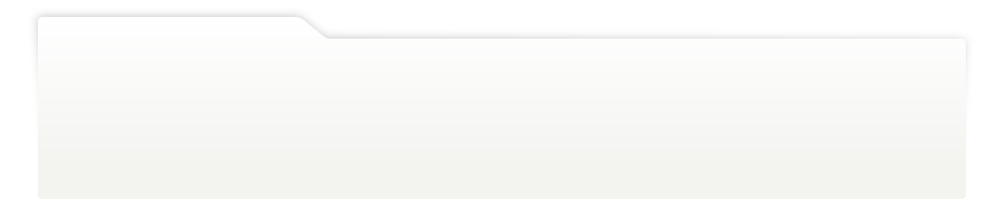
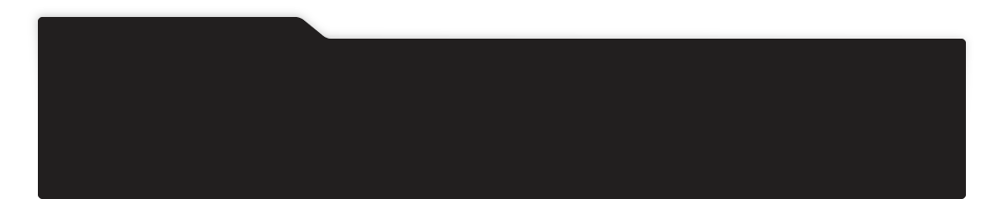
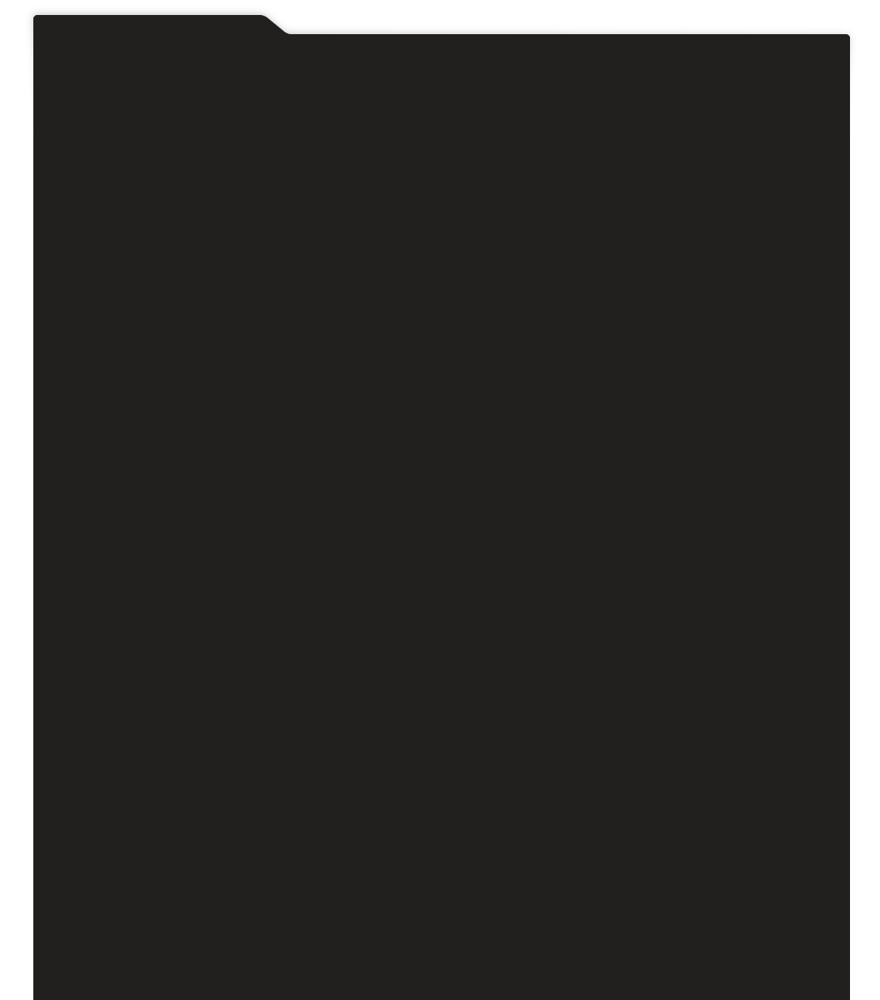
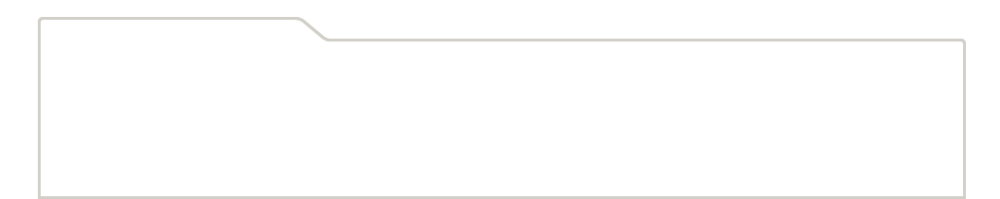
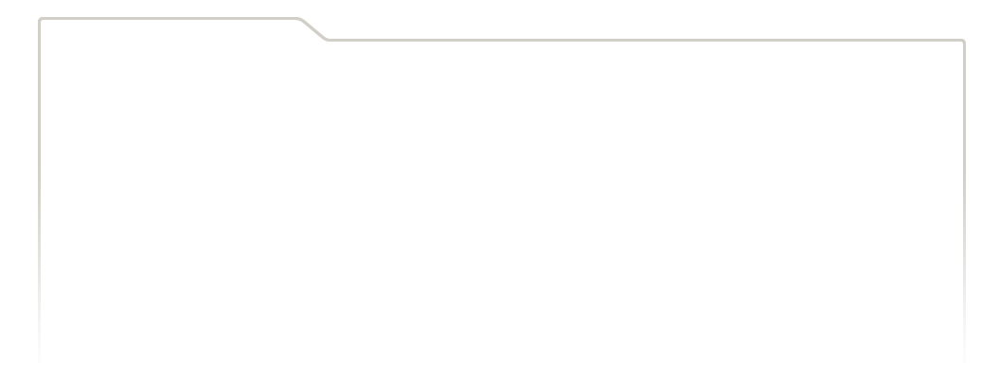
...
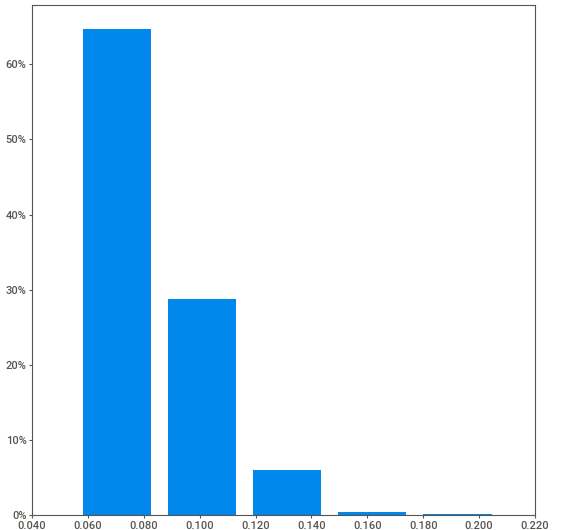
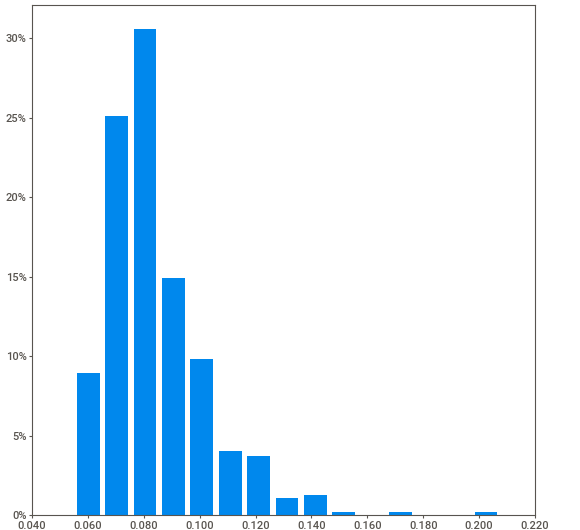
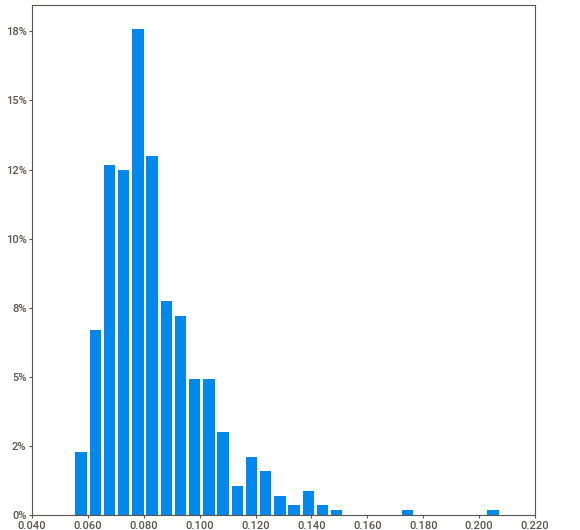
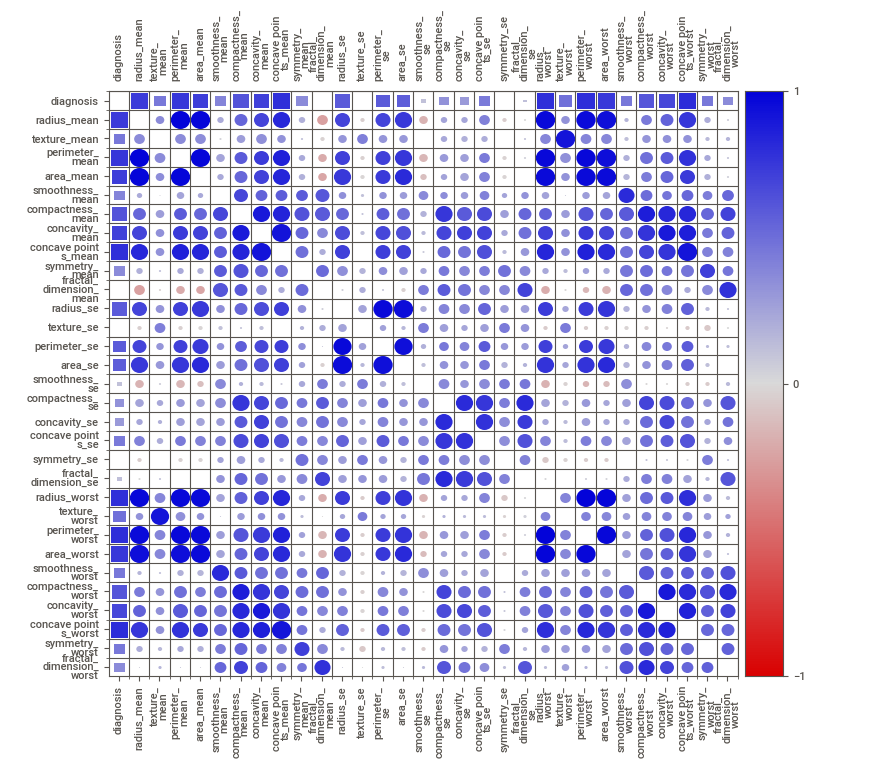
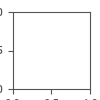

In [15]:
import sweetviz as sv
My_Report = sv.analyze(df)
My_Report.show_notebook(w=None, h=None, scale=None, layout="widescreen", filepath=None)

## **EDA: Exploratory Data Analysis**

In [16]:
df.describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .background_gradient(subset=['std'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.000000,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.110000
texture_mean,569.000000,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.280000
perimeter_mean,569.000000,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.500000
area_mean,569.000000,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.000000
smoothness_mean,569.000000,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.163400
compactness_mean,569.000000,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.345400
concavity_mean,569.000000,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.426800
concave points_mean,569.000000,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.201200
symmetry_mean,569.000000,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.304000
fractal_dimension_mean,569.000000,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.097440


**Data Visualization**

Visualizations help us understand the dataset and evaluate the model’s performance more intuitively. Here are some common visualizations used in classification tasks:

1. Distribution of Target Classes

Explanation:

Countplot: Shows the count of each class in the target variable.

Palette: Colors used for the bars.

Understanding the distribution of target classes helps us see if the dataset is imbalanced:



Number of Benign:  357
Number of Malignant :  212


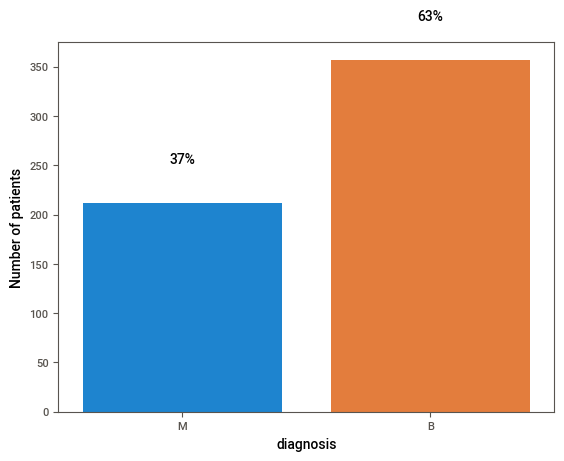

In [17]:
ax = sns.countplot(x=y,label="Count")       # M = 212, B = 357
B, M = y.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)
ax.set_ylabel('Number of patients')
bars = ax.patches
half = int(len(bars)/2)
left_bars = bars[:half]
right_bars = bars[half:]
for left, right in zip(left_bars, right_bars):
    height_l = left.get_height()
    height_r = right.get_height()
    total = height_l + height_r
    ax.text(left.get_x() + left.get_width()/2., height_l + 40, '{0:.0%}'.format(height_l/total), ha="center")
    ax.text(right.get_x() + right.get_width()/2., height_r + 40, '{0:.0%}'.format(height_r/total), ha="center")

            Target Variable Distribution           


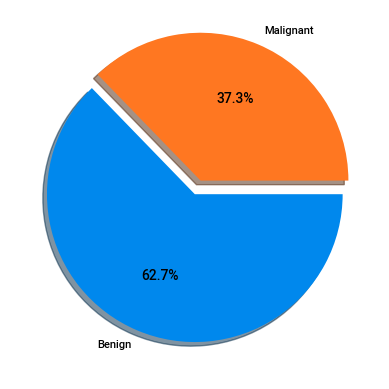

Number of Benign:  357
Number of Malignant :  212


In [18]:
#Let us first analyze the distribution of the target variable

MAP={}
for e, i in enumerate(sorted(df[target].unique())):
    MAP[i]=labels[e]
#MAP={0:'Not-Survived',1:'Survived'}
df1 = df.copy()
df1[target]=df1[target].map(MAP)
explode=np.zeros(len(labels))
explode[-1]=0.1
print('\033[1mTarget Variable Distribution'.center(55))
plt.pie(df1[target].value_counts(), labels=df1[target].value_counts().index, counterclock=False, shadow=True, 
        explode=explode, autopct='%1.1f%%', radius=1, startangle=0)
plt.show()
#M = 212, B = 357
print('Number of Benign: ',B)
print('Number of Malignant : ',M)

                                     Features Distribution                                      


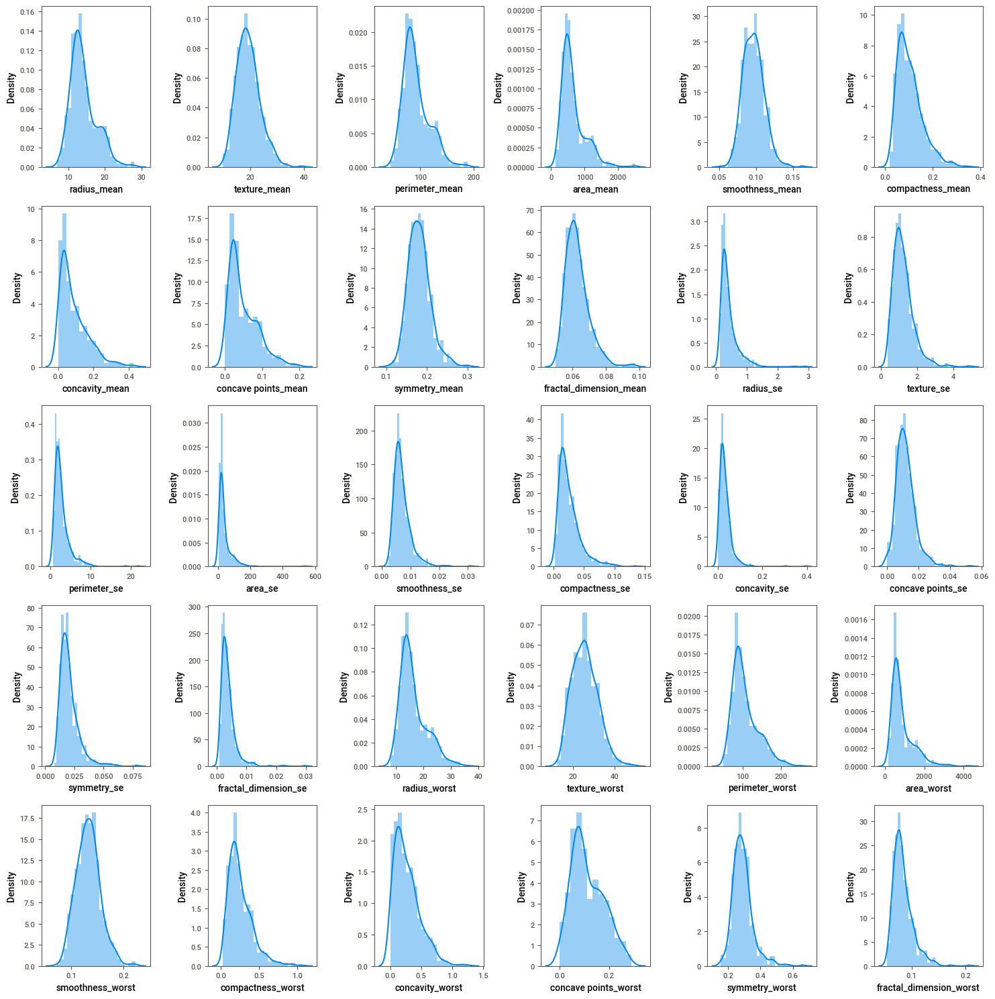

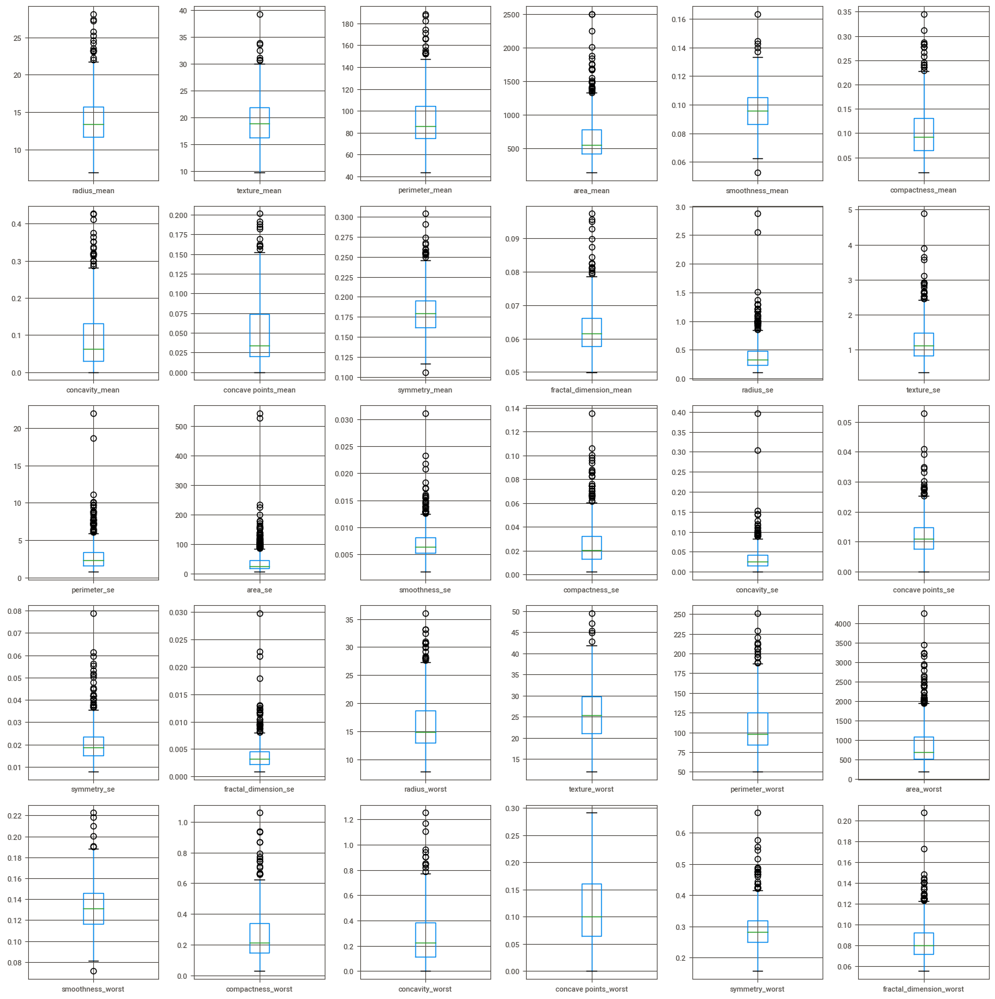

In [19]:
#Understanding the feature set

print('\033[1mFeatures Distribution'.center(100))

n=6
nf = [i for i in features if i not in cf]

plt.figure(figsize=[15,3*math.ceil(len(features)/n)])
for c in range(len(nf)):
    plt.subplot(math.ceil(len(features)/n),n,c+1)
    sns.distplot(df[nf[c]])
plt.tight_layout()
plt.show()

plt.figure(figsize=[15,3*math.ceil(len(features)/n)])
for c in range(len(nf)):
    plt.subplot(math.ceil(len(features)/n),n,c+1)
    df.boxplot(nf[c])
plt.tight_layout()
plt.show()

Above histogram grid shows that all of the features of the dataset were continuous variables with majority of them having long tails on the right.

**Pairplot Analysis**
The provided graph is a pairplot that visualizes the relationships between various features of the breast cancer diagnosis dataset, colored by diagnosis (benign or malignant). Each diagonal of the pair of graphs represents the distribution of a specific feature, while the other cells show scatterplots of the relationships between pairs of features.

Graph Elements
Diagonals: - Shows the distribution of each feature individually.
KDE Plot: Represents the probability density of each feature for benign (green) and malignant (orange) samples.
Off-Diagonal Cells: - Shows scatterplots of the relationships between pairs of features.

B: Benign samples.
M: Malignant samples.

In [20]:
#getting Mean columns with diagnosis
m_col = ['diagnosis','radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

#getting Se columns with diagnosis
s_col= ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']

#getting Worst column with diagnosis
w_col=['diagnosis','radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

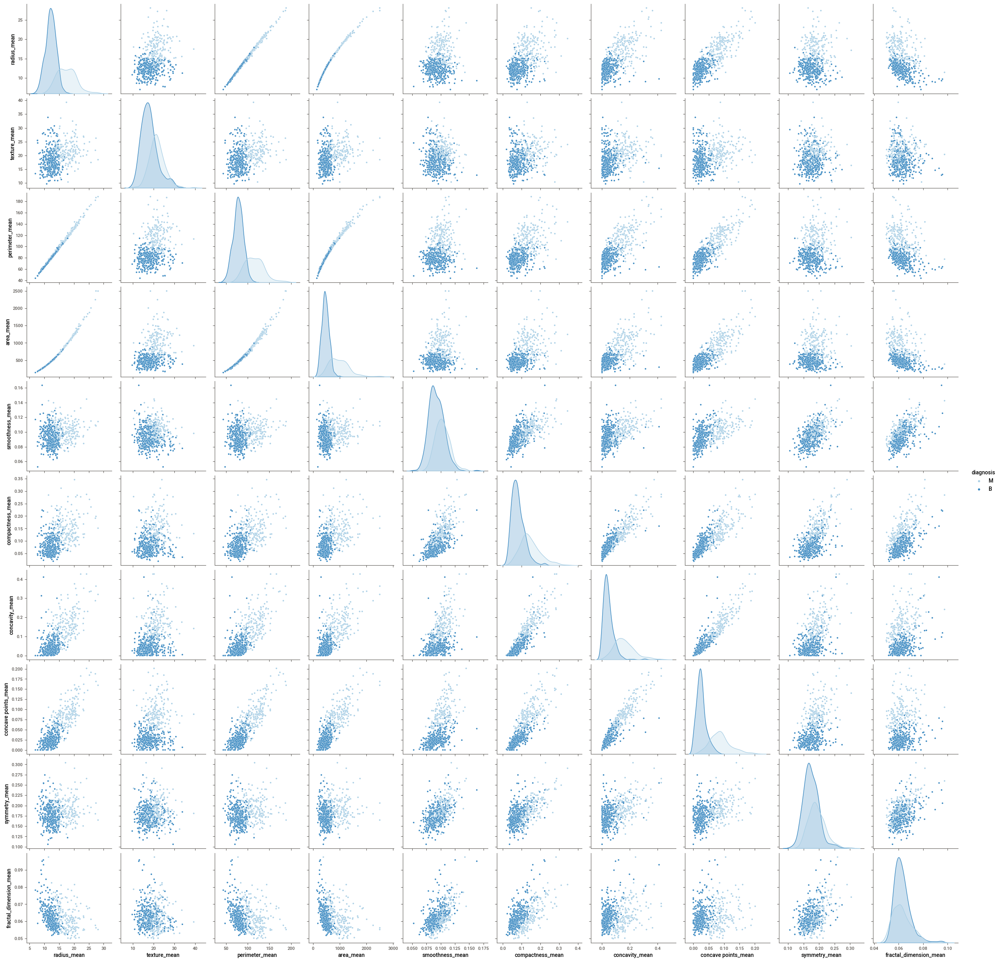

In [21]:
#pairplot for mean columns
sns.pairplot(df[m_col],hue='diagnosis',palette='Blues')

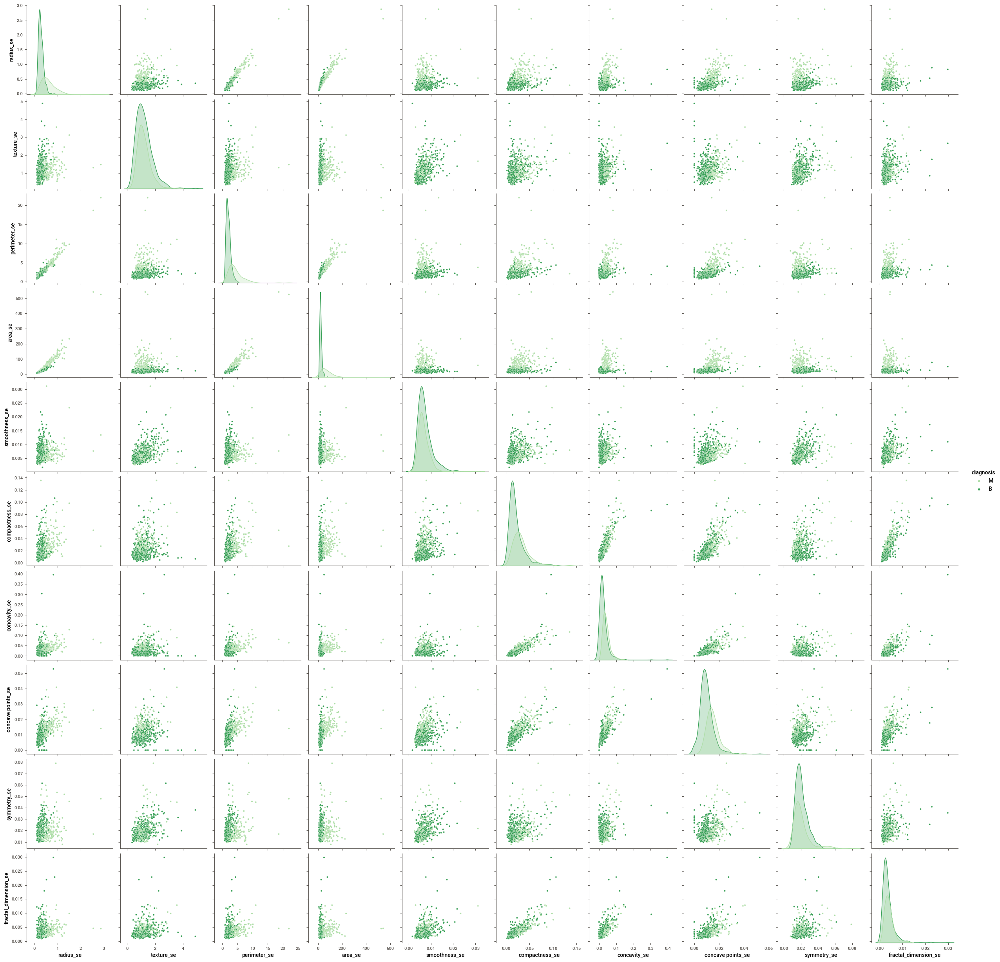

In [22]:
#pairplot for SE columns
sns.pairplot(df[s_col],hue='diagnosis',palette='Greens')

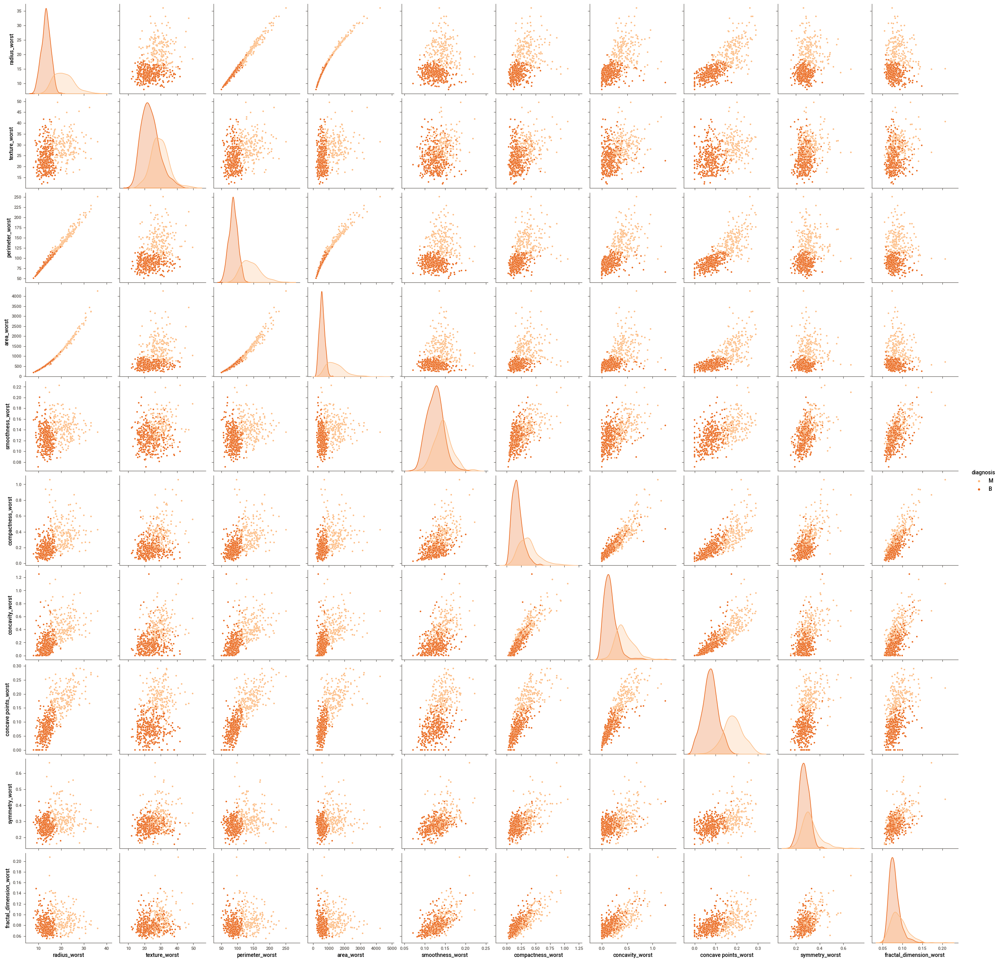

In [23]:
#pairplot for worst columns
sns.pairplot(df[w_col],hue='diagnosis',palette='Oranges')

Data preprocessing is essential in machine learning because it helps to convert raw data into a more suitable form, which can then be more effectively used by a machine learning algorithm. By preprocessing data, it can be better organized and structured, which can reduce noise, simplify features, and eliminate irrelevant and redundant features. This helps improve the accuracy and performance of the machine learning algorithm.

**Data Preprocessing and Splitting**
1. Drop Unnecessary Columns

We start by removing columns that are not useful for our analysis or model training. In this case, we drop the 'Unnamed: 32' column and the 'id' column: The 'id' column is typically an identifier and does not contribute to the prediction, while 'Unnamed: 32' might be an empty or irrelevant column.

2. Separate Features and Target Variable

Next, we separate the features and the target variable: X: Contains all columns except 'diagnosis', which are the features used for prediction. y: Contains the 'diagnosis' column, which is our target variable.

3. Convert Target Variable to Binary

We convert the categorical 'diagnosis' column to binary values for classification: Malignant ('M') is converted to 1. Benign ('B') is converted to 0.

In [24]:
#Removal of any Duplicate rows (if any)

counter = 0
r,c = original_df.shape

df1 = df.copy()
df1.drop_duplicates(inplace=True)
df1.reset_index(drop=True,inplace=True)

if df1.shape==(r,c):
    print('\n\033[1mInference:\033[0m The dataset doesn\'t have any duplicates')
else:
    print(f'\n\033[1mInference:\033[0m Number of duplicates dropped ---> {r-df1.shape[0]}')


Inference: The dataset doesn't have any duplicates


In [25]:
#Check for empty elements

nvc = pd.DataFrame(df1.isnull().sum().sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = round(nvc['Total Null Values']/df1.shape[0],3)*100
print(nvc)

                         Total Null Values  Percentage
diagnosis                                0         0.0
concave points_worst                     0         0.0
concavity_worst                          0         0.0
compactness_worst                        0         0.0
smoothness_worst                         0         0.0
area_worst                               0         0.0
perimeter_worst                          0         0.0
texture_worst                            0         0.0
radius_worst                             0         0.0
fractal_dimension_se                     0         0.0
symmetry_se                              0         0.0
concave points_se                        0         0.0
concavity_se                             0         0.0
compactness_se                           0         0.0
symmetry_worst                           0         0.0
smoothness_se                            0         0.0
perimeter_se                             0         0.0
texture_se

In [26]:
#Converting categorical Columns to Numeric

#df1 = df.copy()
ecc = nvc[nvc['Percentage']!=0].index.values
dcc = [i for i in df.columns if i not in ecc]

#Target Variable
MAP={}
for i,e in enumerate(df1[target].unique()):
    MAP[e]=i
df1[target]=df1[target].map(MAP)
print('Mapping Target variable --->',MAP)

df3 = df1[dcc]
fcc = [i for i in cf if i not in ecc]

#One-Hot Binay Encoding
oh=True
dm=True
for i in fcc:
    #print(i)
    if df3[i].nunique()==2:
        if oh==True: print("\033[1m\nOne-Hot Encoding on features:\033[0m")
        print(i);oh=False
        df3[i]=pd.get_dummies(df3[i], drop_first=True, prefix=str(i))
    if (df3[i].nunique()>2 and df3[i].nunique()<17):
        if dm==True: print("\n\033[1mDummy Encoding on features:\033[0m")
        print(i);dm=False
        df3 = pd.concat([df3.drop([i], axis=1), pd.DataFrame(pd.get_dummies(df3[i], drop_first=True, prefix=str(i)))],axis=1)
        
df3.shape

Mapping Target variable ---> {'M': 0, 'B': 1}


(569, 31)

In [27]:
#Removal of outlier:

df4 = df3.copy()

for i in [i for i in df4.columns]:
    if df4[i].nunique()>=12:
        Q1 = df4[i].quantile(0.15)
        Q3 = df4[i].quantile(0.85)
        IQR = Q3 - Q1
        df4 = df4[df4[i] <= (Q3+(1.5*IQR))]
        df4 = df4[df4[i] >= (Q1-(1.5*IQR))]
df4 = df4.reset_index(drop=True)
display(df4.head())
print('\n\033[1mInference:\033[0m Before removal of outliers, The dataset had {} samples.'.format(df1.shape[0]))
print('\033[1mInference:\033[0m After removal of outliers, The dataset now has {} samples.'.format(df4.shape[0]))

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
1,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
2,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.2,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
3,0,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,0.2087,...,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
4,0,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.1127,0.07400,0.1794,...,22.88,27.66,153.2,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368



Inference: Before removal of outliers, The dataset had 569 samples.
Inference: After removal of outliers, The dataset now has 502 samples.


In [28]:
from imblearn.over_sampling import SMOTE

In [29]:
#Fixing the imbalance using SMOTE Technique

df5 = df4.copy()

print('Original class distribution:')
print(df5[target].value_counts())

xf = df5.columns
X = df5.drop([target],axis=1)
Y = df5[target]

smote = SMOTE()
X, Y = smote.fit_resample(X, Y)

df5 = pd.DataFrame(X, columns=xf)
df5[target] = Y

print('\nClass distribution after applying SMOTE Technique:',)
print(Y.value_counts())

Original class distribution:
1    337
0    165
Name: diagnosis, dtype: int64

Class distribution after applying SMOTE Technique:
0    337
1    337
Name: diagnosis, dtype: int64


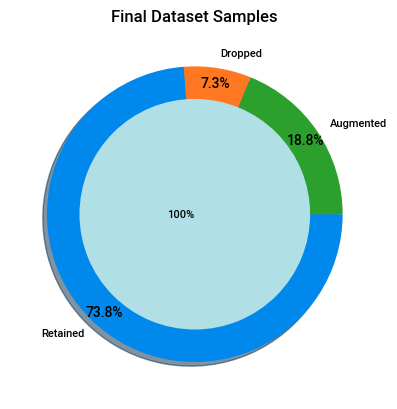

In [30]:
#Final Dataset size after performing Preprocessing

df = df5.copy()
plt.title('Final Dataset Samples')
plt.pie([df.shape[0], original_df.shape[0]-df4.shape[0], df5.shape[0]-df4.shape[0]], radius = 1, shadow=True,
        labels=['Retained','Dropped','Augmented'], counterclock=False, autopct='%1.1f%%', pctdistance=0.9, explode=[0,0,0])
plt.pie([df.shape[0]], labels=['100%'], labeldistance=-0, radius=0.78, shadow=True, colors=['powderblue'])
plt.show()

# Splitting the data into train and test

**Split the Data into Training and Testing Sets**

We split the dataset into training and testing sets to evaluate the performance of our model: X_train and y_train: Training features and target variable. X_test and y_test: Testing features and target variable. test_size=0.3: 30% of the data is used for testing. random_state=42: Ensures reproducibility by setting a seed for random number generation.

**Optionally Scale the Features**

Scaling the features helps improve the performance and convergence of many machine learning algorithms:

StandardScaler(): Standardizes features by removing the mean and scaling to unit variance. fit_transform(): Fits the scaler on the training data and transforms it. transform(): Transforms the test data using the fitted scaler.

In [31]:
#Splitting the data intro training & testing sets

df = df5.copy()

X = df.drop([target],axis=1)
Y = df[target]
Train_X, Test_X, Train_Y, Test_Y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)

print('Original set  ---> ',X.shape,Y.shape,'\nTraining set  ---> ',Train_X.shape,Train_Y.shape,'\nTesting set   ---> ', Test_X.shape,'', Test_Y.shape)

Original set  --->  (674, 30) (674,) 
Training set  --->  (539, 30) (539,) 
Testing set   --->  (135, 30)  (135,)


What is Standardization?
Standardization is a data preprocessing technique used in statistics and machine learning to transform the features of your dataset so that they have a mean of 0 and a standard deviation of 1. This process involves rescaling the distribution of values so that the mean of observed values is aligned to 0 and the standard deviation to 1. 

Standardisation aims to adjust the scale of data without distorting differences in the ranges of values or losing information.
Unlike other scaling techniques, standardization maintains all original data points' information (except for cases of constant columns).
It ensures that no single feature dominates the model's output due to its scale, leading to more balanced and interpretable models.
Formula of Standardization
Z = (x-mean)/standard deviation

In [32]:
#Feature Scaling (Standardization)

std = StandardScaler()

print('\033[1mStandardardization on Training set'.center(100))
Train_X_std = std.fit_transform(Train_X)
Train_X_std = pd.DataFrame(Train_X_std, columns=X.columns)
display(Train_X_std.describe())

print('\n','\033[1mStandardardization on Testing set'.center(100))
Test_X_std = std.transform(Test_X)
Test_X_std = pd.DataFrame(Test_X_std, columns=X.columns)
display(Test_X_std.describe())

                               Standardardization on Training set                               


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,...,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02,5.390000e+02
mean,-3.163827e-16,8.041393e-16,-5.108262e-17,-3.048479e-16,-8.305045e-16,4.943479e-17,-1.433609e-16,6.261740e-17,1.107339e-15,6.286458e-16,...,-5.932175e-16,3.048479e-16,-3.229740e-16,-2.175131e-16,6.443001e-16,-1.186435e-16,2.702435e-16,1.194674e-16,9.458523e-16,1.021652e-16
std,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,...,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00,1.000929e+00
min,-2.298122e+00,-2.299746e+00,-2.260375e+00,-1.719830e+00,-3.499754e+00,-1.968573e+00,-1.373698e+00,-1.493503e+00,-2.729940e+00,-2.116729e+00,...,-1.972149e+00,-2.405885e+00,-1.963137e+00,-1.476666e+00,-2.503410e+00,-1.708514e+00,-1.584541e+00,-2.009609e+00,-2.436392e+00,-1.718402e+00
25%,-7.614160e-01,-6.722525e-01,-7.722294e-01,-7.730009e-01,-7.165363e-01,-7.887432e-01,-8.391401e-01,-8.347864e-01,-7.758903e-01,-7.879019e-01,...,-8.057202e-01,-7.412978e-01,-8.167287e-01,-7.856213e-01,-6.712126e-01,-7.483227e-01,-8.254424e-01,-8.196521e-01,-6.904125e-01,-7.208578e-01
50%,-2.331640e-01,-3.227607e-02,-2.051612e-01,-3.134648e-01,3.776393e-02,-8.002223e-02,-1.634165e-01,-2.068179e-01,1.471393e-02,-1.156517e-01,...,-2.300522e-01,-1.662820e-02,-2.123447e-01,-3.233942e-01,-1.755964e-03,-2.059498e-01,-1.174993e-01,-3.393772e-02,-1.174630e-01,-1.760400e-01
75%,7.767853e-01,6.064000e-01,7.592997e-01,7.030662e-01,6.857800e-01,6.049032e-01,7.493676e-01,8.312240e-01,6.175388e-01,6.769287e-01,...,7.145507e-01,7.313600e-01,7.057557e-01,6.421625e-01,6.622064e-01,6.475033e-01,6.581891e-01,8.519887e-01,5.302387e-01,4.965466e-01
max,3.145261e+00,3.624072e+00,3.303995e+00,3.629602e+00,3.200114e+00,3.645953e+00,3.812173e+00,3.663861e+00,3.275956e+00,3.217091e+00,...,2.786276e+00,4.171747e+00,3.116649e+00,3.070608e+00,2.647883e+00,3.488847e+00,3.294646e+00,2.581438e+00,3.580774e+00,3.210073e+00



                                Standardardization on Testing set                                


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,...,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000,135.000000
mean,0.113727,0.023439,0.102615,0.114370,-0.051375,-0.078548,-0.057604,0.005351,-0.122746,-0.103081,...,0.108294,-0.014999,0.080219,0.111776,-0.033945,-0.051360,-0.081512,-0.027278,-0.086074,-0.066831
std,1.013683,1.173239,1.011898,1.018379,0.928316,1.013017,0.952824,0.980358,1.126354,0.945166,...,1.022290,1.151527,1.023651,1.044931,0.931811,1.071337,0.973637,1.013484,1.075354,0.968280
min,-2.074883,-2.561701,-2.077815,-1.610960,-2.574923,-1.806807,-1.373698,-1.493503,-2.891655,-1.792762,...,-1.724849,-2.558353,-1.750233,-1.356518,-2.295761,-1.642541,-1.584541,-2.009609,-2.294553,-1.857505
25%,-0.571902,-0.843269,-0.612544,-0.631131,-0.644358,-0.870637,-0.930404,-0.913195,-0.802843,-0.827126,...,-0.667732,-0.814462,-0.732323,-0.684987,-0.537321,-0.944257,-0.927790,-0.929664,-0.839206,-0.754345
50%,-0.045142,-0.178169,-0.051794,-0.170978,0.000485,-0.065329,-0.092375,0.061812,-0.187429,-0.218721,...,-0.143810,-0.052503,-0.125415,-0.249928,-0.034642,-0.173218,-0.049167,0.043243,-0.218910,-0.212748
75%,0.979206,0.783603,0.932425,0.912563,0.509906,0.543432,0.568631,0.732718,0.553762,0.410571,...,0.951428,0.830316,0.876265,0.883830,0.536158,0.541275,0.585536,0.824422,0.506276,0.514320
max,2.563288,3.688912,2.458730,3.037448,2.565582,4.025375,2.287176,2.688294,4.187846,2.182544,...,2.607323,3.430933,2.370224,3.172007,2.070036,3.628902,2.210142,2.639086,3.555212,3.222953


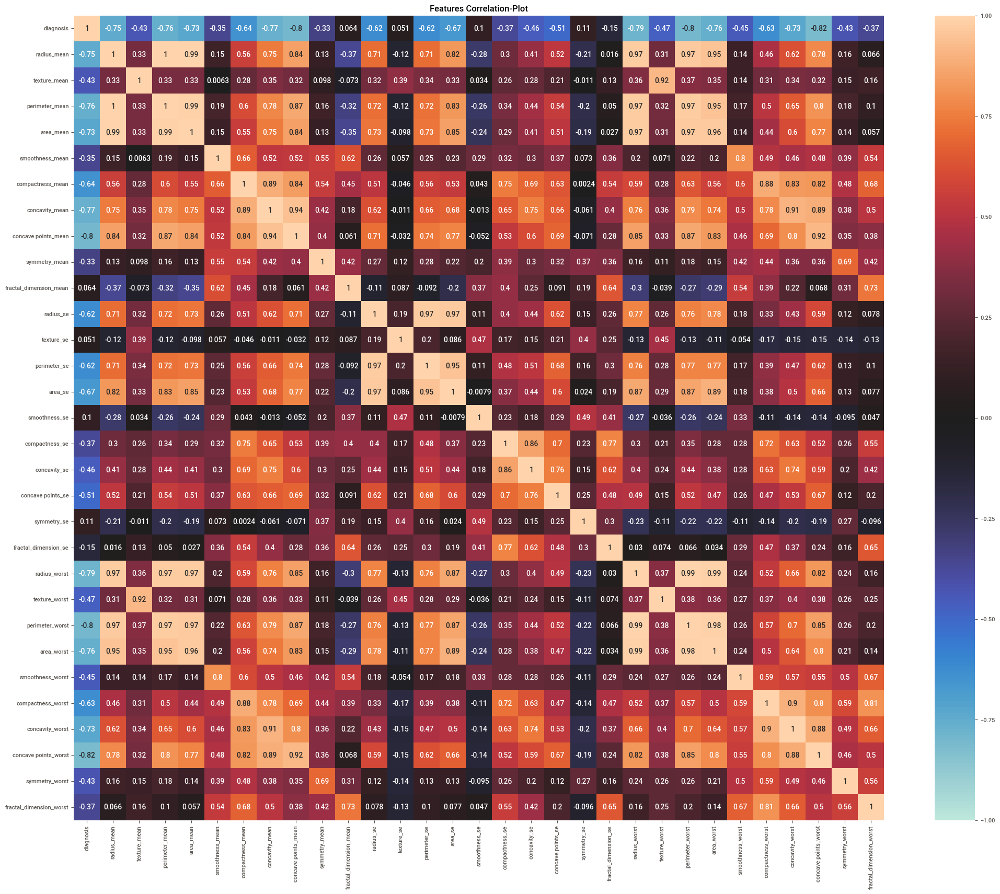

In [33]:
#Checking the correlation

features = df.columns
plt.figure(figsize=[25,20])
plt.title('Features Correlation-Plot')
sns.heatmap(df[features].corr(), vmin=-1, vmax=1, center=0, annot=True) #, 
plt.show()

Correlation analysis

Correlation Matrix Analysis
The provided correlation matrix shows the correlations between various features of the breast cancer diagnosis dataset and the diagnosis (benign or malignant). Let's analyze this matrix and highlight the most meaningful correlations for the business team.

Understanding the Correlation Matrix
Correlation (r): Measures the strength and direction of the linear relationship between two variables. Ranges from -1 to 1.
r = 1: Perfect positive correlation.
r = -1: Perfect negative correlation.
r = 0: No linear correlation.
Key Observations

Correlation with Diagnosis (Malignant/Benign):
- Radius Mean (0.75):
Strong positive correlation. Tumors with higher radius_mean tend to be malignant.
- Perimeter Mean (0.76):
Strong positive correlation. Tumors with higher perimeter_mean tend to be malignant.
- Area Mean (0.73):
Strong positive correlation. Tumors with higher area_mean tend to be malignant.
- Concavity Mean (0.71):
Strong positive correlation. Tumors with higher concavity_mean tend to be malignant.
- Concave Points Mean (0.78):
Stronger positive correlation. Tumors with higher concave points_mean tend to be malignant.
- Fractal Dimension Mean (0.48):
Moderate positive correlation.

Internal Correlations Between Features:
Radius Mean, Perimeter Mean, and Area Mean:
- Almost perfect correlations (0.99). All of these features are strongly related to tumor size. - Concavity Mean and Concave -Points Mean:Highly correlated (0.86). Features related to irregularity of tumor contours."Worst" Features:
- radius_worst, perimeter_worst, and area_worst also show very strong correlations with each other.
- Negative Correlations:
- Smoothness Mean (-0.22):Weaker negative correlation. Tumors with greater smoothness tend to be benign.

In the mean group data, they are dependent on each other, no matter how much or little, but the important thing is that they are dependent on each other

The texture column does not depend on any of the columns

Se columns are less dependent on mean columns and they are less dependent on each other than themselves except for area and perimeter columns which have high dependence.

The worst column is dependent on each other than the mean column, but except for the compactness_mean, concavity_mean, concave points_mean, and radius_mean columns, they are less dependent on the means and have very little dependence on the se columns.

📌 Observation:
- There are several intercorrelated variables identified in the dataset that should be considered for deletion to enhance model performance.

## Model Training and Evaluation

analysis on various feature selection methods

In [34]:
import matplotlib.pyplot as plt
import time

Filter method of feature selection
chi2
chi2 is calculated as the ratio of square of the difference between the observed and expected value to that of the expected value. The expected value refers to the product of data and its average. The p-value is the equivalent value of the chi2 tested at 0.05 level of significance.

Note- This method works the best for categorical variables.

In [35]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
# find best scored 10 features
select_feature = SelectKBest(chi2, k=10).fit(Train_X, Train_Y)
# let's print the number of total and selected features
# this is how we can make a list of the selected features
selected_feature_chi2 = Train_X.columns[select_feature.get_support()]
# let's print some stats
print('total features: {}'.format((Train_X.shape[1])))
print('selected features: {}'.format(len(selected_feature_chi2)))
print('Chosen best 10 feature by Chi2:',selected_feature_chi2)

total features: 30
selected features: 10
Chosen best 10 feature by Chi2: Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'perimeter_se', 'area_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst'],
      dtype='object')


Recursive feature elimination (RFE) with random forest¶
http://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

Basically, it uses one of the classification methods (random forest in our example), assign weights to each of features. Whose absolute weights are the smallest are pruned from the current set features. That procedure is recursively repeated on the pruned set until the desired number of features



In [36]:
from sklearn.feature_selection import RFE
# Create the RFE object and rank each pixel
clf_rf_3 = RandomForestClassifier()      
rfe = RFE(estimator=clf_rf_3, n_features_to_select=10, step=1)
rfe = rfe.fit(Train_X, Train_Y)
# let's print the number of total and selected features
# this is how we can make a list of the selected features
selected_feature_rfe = Train_X.columns[rfe.support_]
# let's print some stats
print('total features: {}'.format((Train_X.shape[1])))
print('selected features: {}'.format(len(selected_feature_rfe)))
print('Chosen best 10 feature by rfe:',Train_X.columns[rfe.support_])

total features: 30
selected features: 10
Chosen best 10 feature by rfe: Index(['radius_mean', 'area_mean', 'concavity_mean', 'concave points_mean',
       'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',
       'concavity_worst', 'concave points_worst'],
      dtype='object')


Chosen 10 best features by rfe is texture_mean, area_mean, smoothness_mean, concavity_mean, area_se, concavity_se, 'fractal_dimension_se', 'smoothness_worst', 'concavity_worst', 'fractal_dimension_worst'. Shortly, we can say that we make good feature selection with rfe and selectkBest methods. However as you can see there is a problem, okey I except we find best 5 feature with two different method and these features are same but why it is 10. Maybe if we use best 2 or best 15 feature we will have better accuracy. Therefore lets see how many feature we need to use with rfecv method.

In [37]:
from tqdm import tqdm
from statsmodels.stats.outliers_influence import variance_inflation_factor

What Is a Variance Inflation Factor (VIF)?
A variance inflation factor (VIF) is a measure of the amount of multicollinearity in regression analysis. Multicollinearity exists when there is a correlation between multiple independent variables in a multiple regression model. This can adversely affect the regression results. Thus, the variance inflation factor can estimate how much the variance of a regression coefficient is inflated due to multicollinearity.

- Key Takeaways
A variance inflation factor (VIF) provides a measure of multicollinearity among the independent variables in a multiple regression model.
Detecting multicollinearity is important because while multicollinearity does not reduce the explanatory power of the model, it does reduce the statistical significance of the independent variables. 
A large VIF on an independent variable indicates a highly collinear relationship to the other variables that should be considered or adjusted for in the structure of the model and selection of independent variables.

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:31<00:00,  1.08s/it]


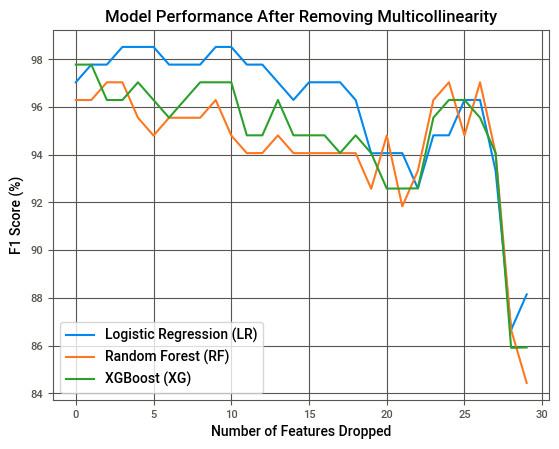

In [38]:
import pandas as pd
from tqdm import tqdm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import f1_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
import matplotlib.pyplot as plt

# Initialize DROP list and score lists
DROP = []
scores1 = []
scores2 = []
scores3 = []

# Initial models without any feature removal
scores1.append(f1_score(Test_Y, LogisticRegression().fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)
scores2.append(f1_score(Test_Y, RandomForestClassifier().fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)
scores3.append(f1_score(Test_Y, XGBClassifier(eval_metric='logloss').fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)

# Loop to calculate VIF and drop features with high VIF values
for i in tqdm(range(len(X.columns.values) - 1)):
    vif = pd.DataFrame()
    Xs = X.drop(DROP, axis=1)
    
    # Calculate VIF for each feature
    vif['Features'] = Xs.columns
    vif['VIF'] = [variance_inflation_factor(Xs.values, i) for i in range(Xs.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    
    # Sort VIF values
    vif = vif.sort_values(by="VIF", ascending=False)
    vif.reset_index(drop=True, inplace=True)
    
    # Drop the feature with the highest VIF
    DROP.append(vif.Features[0])
    
    # Recalculate scores after dropping the feature
    if vif.VIF[0] > 1:
        scores1.append(f1_score(Test_Y, LogisticRegression().fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)
        scores2.append(f1_score(Test_Y, RandomForestClassifier().fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)
        scores3.append(f1_score(Test_Y, XGBClassifier(eval_metric='logloss').fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)

# Plotting the scores for comparison
plt.plot(scores1, label='Logistic Regression (LR)')
plt.plot(scores2, label='Random Forest (RF)')
plt.plot(scores3, label='XGBoost (XG)')
plt.xlabel('Number of Features Dropped')
plt.ylabel('F1 Score (%)')
plt.title('Model Performance After Removing Multicollinearity')
plt.legend()
plt.grid(True)
plt.show()


In [39]:
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel
lsvc = LinearSVC(C=0.01, penalty="l1", dual=False,max_iter=2000).fit(Train_X, Train_Y) 
model = SelectFromModel(lsvc, prefit=True) 
x_new = model.transform(Train_X) 
print(Train_X.columns[model.get_support()])
# let's print the number of total and selected features
# this is how we can make a list of the selected features
selected_feature_lsvc = Train_X.columns[model.get_support()]
# let's print some stats
print('total features: {}'.format((Train_X.shape[1])))
print('selected features: {}'.format(len(selected_feature_lsvc)))
print('Best features by lsvc:',Train_X.columns[model.get_support()])

Index(['perimeter_mean', 'area_mean', 'area_se', 'texture_worst',
       'perimeter_worst', 'area_worst'],
      dtype='object')
total features: 30
selected features: 6
Best features by lsvc: Index(['perimeter_mean', 'area_mean', 'area_se', 'texture_worst',
       'perimeter_worst', 'area_worst'],
      dtype='object')


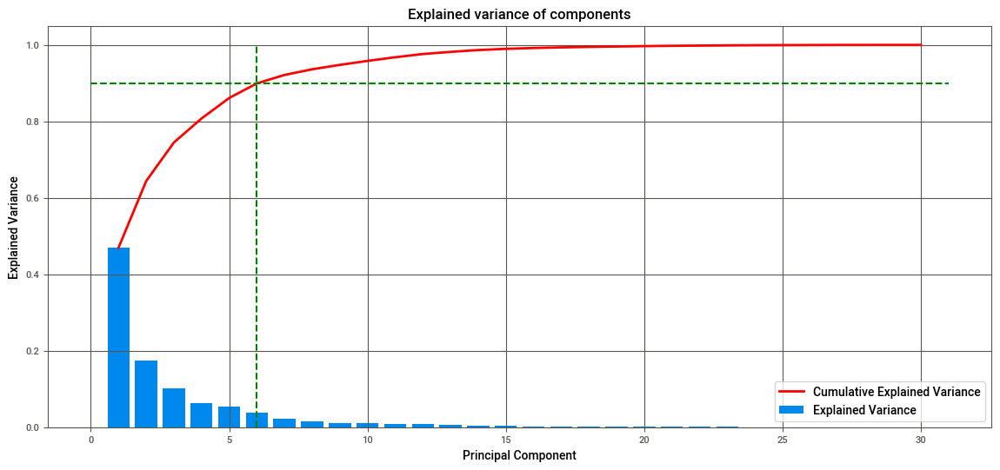

In [40]:
from sklearn.decomposition import PCA

pca = PCA().fit(Train_X_std)

fig, ax = plt.subplots(figsize=(14,6))
x_values = range(1, pca.n_components_+1)
ax.bar(x_values, pca.explained_variance_ratio_, lw=2, label='Explained Variance')
ax.plot(x_values, np.cumsum(pca.explained_variance_ratio_), lw=2, label='Cumulative Explained Variance', color='red')
plt.plot([0,pca.n_components_+1],[0.90,0.90],'g--')
plt.plot([6,6],[0,1], 'g--')
ax.set_title('Explained variance of components')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')
plt.grid()
plt.legend()
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:35<00:00,  1.19s/it]


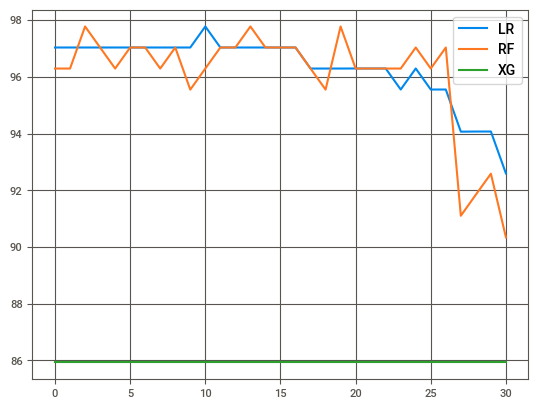

In [41]:
# Applying Recurrsive Feature Elimination

# Running RFE with the output number of the variable equal to 10
LR = LogisticRegression()#.fit(Train_X_std, Train_Y)
scores1=[]; scores2=[]; scores3=[]
scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
scores3.append(f1_score(Test_Y,XGBClassifier(eval_metric='logloss').fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)

for i in tqdm(range(len(X.columns.values))):
    rfe = RFE(LR,n_features_to_select=len(Train_X_std.columns)-i)   
    rfe = rfe.fit(Train_X_std, Train_Y)
    scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
    scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
    scores3.append(f1_score(Test_Y,XGBClassifier(eval_metric='logloss').fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)

plt.plot(scores1, label='LR')
plt.plot(scores2, label='RF')
plt.plot(scores3, label='XG')
#plt.ylim([0.80,0.84])
plt.legend()
plt.grid()
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:30<00:00,  1.03s/it]


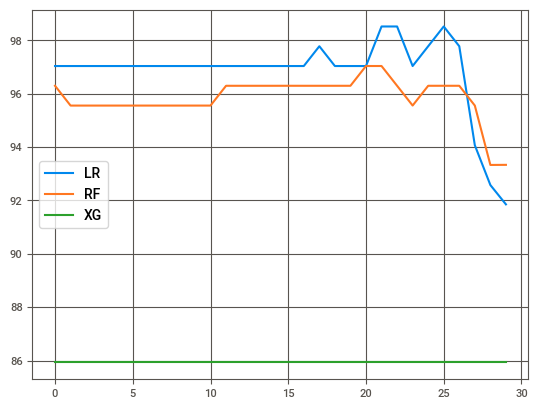

In [42]:
#Applying PCA Transformations

# scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
# scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std, Train_Y).predict(Test_X_std),average='weighted')*100)
# scores3.append(f1_score(Test_Y,XGBClassifier().fit(Train_X_std, Train_Y, eval_metric='logloss').predict(Test_X_std),average='weighted')*100)

scores1=[]; scores2=[]; scores3=[]
for i in tqdm(range(len(X.columns.values))):
    pca = PCA(n_components=Train_X_std.shape[1]-i)
    Train_X_std_pca = pca.fit_transform(Train_X_std)
    #print('The shape of final transformed training feature set:')
    #print(Train_X_std_pca.shape)
    Train_X_std_pca = pd.DataFrame(Train_X_std_pca)

    Test_X_std_pca = pca.transform(Test_X_std)
    #print('\nThe shape of final transformed testing feature set:')
    #print(Test_X_std_pca.shape)
    Test_X_std_pca = pd.DataFrame(Test_X_std_pca)
    
    scores1.append(f1_score(Test_Y,LogisticRegression().fit(Train_X_std_pca, Train_Y).predict(Test_X_std_pca),average='weighted')*100)
    scores2.append(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std_pca, Train_Y).predict(Test_X_std_pca),average='weighted')*100)
    scores3.append(f1_score(Test_Y,XGBClassifier(eval_metric='logloss').fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)

    
plt.plot(scores1, label='LR')
plt.plot(scores2, label='RF')
plt.plot(scores3, label='XG')
#plt.ylim([0.80,0.84])
plt.legend()
plt.grid()
plt.show()

In [43]:
#### Finalising the shortlisted features

rfe = RFE(LR,n_features_to_select=len(Train_X_std.columns)-17)   
rfe = rfe.fit(Train_X_std, Train_Y)

print(f1_score(Test_Y,LogisticRegression().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
print(f1_score(Test_Y,RandomForestClassifier().fit(Train_X_std[Train_X_std.columns[rfe.support_]], Train_Y).predict(Test_X_std[Train_X_std.columns[rfe.support_]]),average='weighted')*100)
print(f1_score(Test_Y,XGBClassifier(eval_metric='logloss').fit(Train_X_std.drop(DROP, axis=1), Train_Y).predict(Test_X_std.drop(DROP, axis=1)), average='weighted') * 100)

    
Train_X_std = Train_X_std[Train_X_std.columns[rfe.support_]]
Test_X_std = Test_X_std[Test_X_std.columns[rfe.support_]]

print(Train_X_std.shape)
print(Test_X_std.shape)

96.29385550084105
97.77753385897834
85.92592592592592
(539, 13)
(135, 13)


In [44]:
#Let us create first create a table to store the results of various models 

Evaluation_Results = pd.DataFrame(np.zeros((5,5)), columns=['Accuracy', 'Precision','Recall','F1-score','AUC-ROC score'])
Evaluation_Results.index=['Logistic Regression (LR)','Decision Tree Classifier (DT)',
                         'Support Vector Machine (SVM)','K Nearest Neighbours (KNN)','Extreme Gradient Boosting (XGB)']
Evaluation_Results

,Accuracy,Precision,Recall,F1-score,AUC-ROC score
Logistic Regression (LR),0.0,0.0,0.0,0.0,0.0
Decision Tree Classifier (DT),0.0,0.0,0.0,0.0,0.0
Support Vector Machine (SVM),0.0,0.0,0.0,0.0,0.0
K Nearest Neighbours (KNN),0.0,0.0,0.0,0.0,0.0
Extreme Gradient Boosting (XGB),0.0,0.0,0.0,0.0,0.0


In [45]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, \
f1_score, roc_auc_score, roc_curve, precision_score, recall_score
from sklearn.ensemble import RandomForestClassifier

In [46]:
from sklearn.model_selection import RandomizedSearchCV, RepeatedStratifiedKFold
from xgboost import XGBClassifier
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Training XGBClassifier
XGB_model = XGBClassifier(eval_metric='logloss')

param_dist = {
    "learning_rate": [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
    "max_depth": [3, 4, 5, 6, 8, 10, 12, 15],
    "min_child_weight": [1, 3, 5, 7],
    "gamma": [0.0, 0.1, 0.2, 0.3, 0.4],
    "colsample_bytree": [0.3, 0.4, 0.5, 0.7]
}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# Use RandomizedSearchCV for hyperparameter tuning
RCV = RandomizedSearchCV(XGB_model, param_dist, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=1)
XGB = RCV.fit(Train_X_std, Train_Y).best_estimator_

# Generate predictions
pred = XGB.predict(Test_X_std)
pred_prob = XGB.predict_proba(Test_X_std)


<<<----------------------------------- Evaluating 5 ----------------------------------->>>

Accuracy = 94.1%
F1 Score = 94.1%

 Confusion Matrix:
 [[66  2]
 [ 6 61]]

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.97      0.94        68
           1       0.97      0.91      0.94        67

    accuracy                           0.94       135
   macro avg       0.94      0.94      0.94       135
weighted avg       0.94      0.94      0.94       135



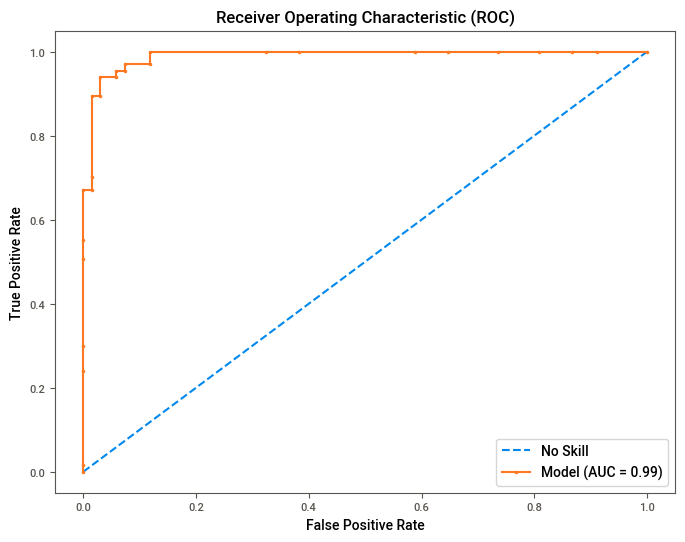

In [47]:
# Classification Summary Function
def Classification_Summary(pred, pred_prob, i):
    Evaluation_Results.loc[i, 'Accuracy'] = round(accuracy_score(Test_Y, pred), 3) * 100   
    Evaluation_Results.loc[i, 'Precision'] = round(precision_score(Test_Y, pred, average='weighted'), 3) * 100
    Evaluation_Results.loc[i, 'Recall'] = round(recall_score(Test_Y, pred, average='weighted'), 3) * 100
    Evaluation_Results.loc[i, 'F1-score'] = round(f1_score(Test_Y, pred, average='weighted'), 3) * 100
    Evaluation_Results.loc[i, 'AUC-ROC score'] = round(roc_auc_score(Test_Y, pred_prob[:, 1], multi_class='ovr'), 3) * 100
    
    print('{}{}\033[1m Evaluating {} \033[0m{}{}\n'.format('<'*3, '-'*35, Evaluation_Results.index[i], '-'*35, '>'*3))
    print('Accuracy = {}%'.format(round(accuracy_score(Test_Y, pred), 3) * 100))
    print('F1 Score = {}%'.format(round(f1_score(Test_Y, pred, average='weighted'), 3) * 100))
    
    print('\n \033[1mConfusion Matrix:\033[0m\n', confusion_matrix(Test_Y, pred))
    print('\n\033[1mClassification Report:\033[0m\n', classification_report(Test_Y, pred))
    
    

# ROC-AUC Plot Function
def AUC_ROC_plot(Test_Y, pred_prob):
    ns_fpr, ns_tpr, _ = roc_curve(Test_Y, [0 for _ in range(len(Test_Y))])
    lr_fpr, lr_tpr, _ = roc_curve(Test_Y, pred_prob[:, 1])
    
    plt.figure(figsize=(8, 6))
    plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
    plt.plot(lr_fpr, lr_tpr, marker='.', label='Model (AUC = {:.2f})'.format(roc_auc_score(Test_Y, pred_prob[:, 1])))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend()
    plt.show()

# Example Usage
Classification_Summary(pred, pred_prob, 5)
AUC_ROC_plot(Test_Y, pred_prob)


<<<----------------------------------- Evaluating Decision Tree Classifier (DT) ----------------------------------->>>

Accuracy = 91.9%
F1 Score = 91.8%

 Confusion Matrix:
 [[64  4]
 [ 7 60]]

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92        68
           1       0.94      0.90      0.92        67

    accuracy                           0.92       135
   macro avg       0.92      0.92      0.92       135
weighted avg       0.92      0.92      0.92       135


Interpreting the output of Decision Tree:



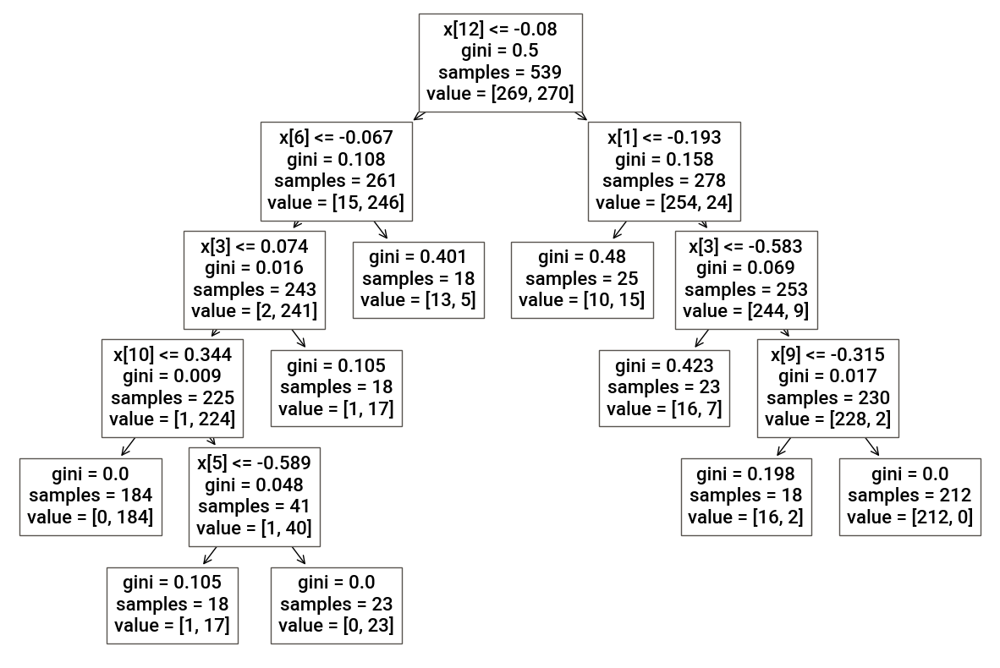

In [48]:
from sklearn import tree
plt.rcParams['figure.figsize'] = [15,10]

#Building Decision Tree Classifier

DT_model = DecisionTreeClassifier()

param_dist = {"max_depth": [3, None],
              "max_features": randint(1, len(features)-1),
              "min_samples_leaf": randint(1, len(features)-1),
              "criterion": ["gini", "entropy"]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(DT_model, param_dist, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1)

DT = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = DT.predict(Test_X_std)
pred_prob = DT.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,1)

print('\n\033[1mInterpreting the output of Decision Tree:\n\033[0m')
tree.plot_tree(DT)
plt.show()

**Decision Tree Analysis**
The image shows a decision tree trained to classify breast tumors as benign or malignant. Let's analyze the structure and interpretation of this tree for the business team.

Decision Tree Structure
- Root Node:
The top node (root) splits the data based on the feature x[12] (a specific feature of the dataset).
- Gini: 0.5, indicating the impurity of the node.
- Samples:539 , total number of samples in this node.
- Value: [269.270], number of benign (269) and malignant (270) samples.
Class: Malignant, the predominant class in this node.

In [49]:
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV, RepeatedStratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, f1_score, precision_score, recall_score
import matplotlib.pyplot as plt
import seaborn as sns

# Building Support Vector Machine Classifier with Randomized Search
SVM_model = SVC(probability=True, random_state=1)

# Define the parameter grid for randomized search
svm_param = {
    "C": [.01, .1, 1, 5, 10, 100],
    "gamma": [.01, .1, 1, 5, 10, 100],
    "kernel": ["rbf"]
}

# Set up cross-validation scheme
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# Apply RandomizedSearchCV for hyperparameter tuning
RCV = RandomizedSearchCV(SVM_model, svm_param, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=1)

# Fit the model
SVM = RCV.fit(Train_X_std, Train_Y).best_estimator_

# Make predictions
pred = SVM.predict(Test_X_std)
pred_prob = SVM.predict_proba(Test_X_std)

# Evaluate the model using the Classification Summary function
Classification_Summary(pred, pred_prob, i=4)


<<<----------------------------------- Evaluating Extreme Gradient Boosting (XGB) ----------------------------------->>>

Accuracy = 97.8%
F1 Score = 97.8%

 Confusion Matrix:
 [[67  1]
 [ 2 65]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.99      0.98        68
           1       0.98      0.97      0.98        67

    accuracy                           0.98       135
   macro avg       0.98      0.98      0.98       135
weighted avg       0.98      0.98      0.98       135



**Feature Importances**

XGBoost provides feature importance scores that can help us understand which features contribute most to the model’s predictions:

<<<----------------------------------- Evaluating 4 ----------------------------------->>>

Accuracy = 94.1%
F1 Score = 94.1%

 Confusion Matrix:
 [[66  2]
 [ 6 61]]

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.97      0.94        68
           1       0.97      0.91      0.94        67

    accuracy                           0.94       135
   macro avg       0.94      0.94      0.94       135
weighted avg       0.94      0.94      0.94       135



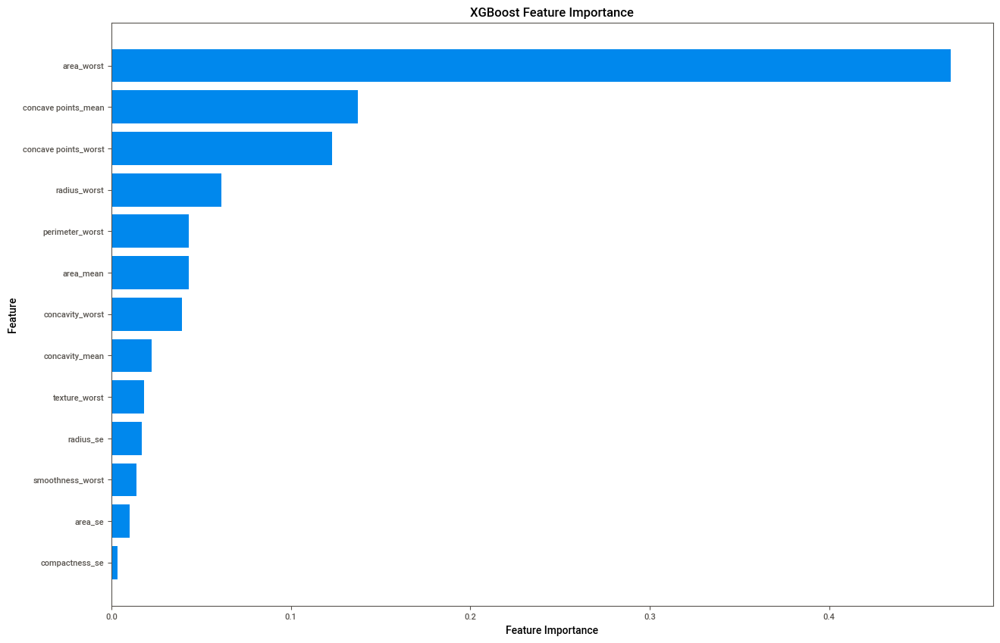

In [50]:
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV, RepeatedStratifiedKFold
import pandas as pd
import matplotlib.pyplot as plt

# Define the model
XGB_model = XGBClassifier()

# Define the parameter grid
param_dist = {
    "learning_rate": [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
    "max_depth": [3, 4, 5, 6, 8, 10, 12, 15],
    "min_child_weight": [1, 3, 5, 7],
    "gamma": [0.0, 0.1, 0.2, 0.3, 0.4],
    "colsample_bytree": [0.3, 0.4, 0.5, 0.7]
}

# Define the cross-validation strategy
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# Define and fit the RandomizedSearchCV
RCV = RandomizedSearchCV(XGB_model, param_distributions=param_dist, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=1)
RCV.fit(Train_X_std, Train_Y)

# Get the best model
XGB = RCV.best_estimator_

# Make predictions
pred = XGB.predict(Test_X_std)
pred_prob = XGB.predict_proba(Test_X_std)

# Print classification summary (assuming this function is defined elsewhere)
Classification_Summary(pred, pred_prob, 7)

# Feature importance plot
if hasattr(Train_X_std, 'columns'):
    xgbf = pd.DataFrame(XGB.feature_importances_, index=Train_X_std.columns).sort_values(by=0)
else:
    xgbf = pd.DataFrame(XGB.feature_importances_).sort_values(by=0)

plt.barh(xgbf.index, xgbf.values[:, 0])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('XGBoost Feature Importance')
plt.show()


**Explanation:**

Feature Importances: Shows the importance of each feature according to the XGBoost model.

Barh Plot: Horizontal bar plot where the length of the bar represents feature importance.

In [51]:
# Building K-Neareset Neighbours Classifier

KNN_model = KNeighborsClassifier()

knn_param = {"n_neighbors": [i for i in range(1,30,5)],
             "weights": ["uniform", "distance"],
             "algorithm": ["ball_tree", "kd_tree", "brute"],
             "leaf_size": [1, 10, 30],
             "p": [1,2]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(KNN_model, knn_param, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1)

KNN = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = KNN.predict(Test_X_std)
pred_prob = KNN.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,5)

<<<----------------------------------- Evaluating 5 ----------------------------------->>>

Accuracy = 96.3%
F1 Score = 96.3%

 Confusion Matrix:
 [[66  2]
 [ 3 64]]

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.97      0.96        68
           1       0.97      0.96      0.96        67

    accuracy                           0.96       135
   macro avg       0.96      0.96      0.96       135
weighted avg       0.96      0.96      0.96       135



What is KNN? KNN (K-Nearest Neighbors) is a machine learning algorithm used for classification and regression. It works by classifying a new observation based on the classes of the closest observations in the data space.

In [52]:
# Building Logistic Regression Classifier

LR_model = LogisticRegression()

space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['l2'] #'none', 'l1', 'l2', 'elasticnet'
space['C'] = loguniform(1e-5, 100)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

RCV = RandomizedSearchCV(LR_model, space, n_iter=50, scoring='roc_auc', n_jobs=-1, cv=5, random_state=1)

LR = RCV.fit(Train_X_std, Train_Y).best_estimator_
pred = LR.predict(Test_X_std)
pred_prob = LR.predict_proba(Test_X_std)
Classification_Summary(pred,pred_prob,0)

print('\n\033[1mInterpreting the Output of Logistic Regression:\n\033[0m')

print('intercept ', LR.intercept_[0])
print('classes', LR.classes_)
display(pd.DataFrame({'coeff': LR.coef_[0]}, index=Train_X_std.columns))

<<<----------------------------------- Evaluating Logistic Regression (LR) ----------------------------------->>>

Accuracy = 96.3%
F1 Score = 96.3%

 Confusion Matrix:
 [[67  1]
 [ 4 63]]

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.99      0.96        68
           1       0.98      0.94      0.96        67

    accuracy                           0.96       135
   macro avg       0.96      0.96      0.96       135
weighted avg       0.96      0.96      0.96       135


Interpreting the Output of Logistic Regression:

intercept  -3.063549815742354
classes [0 1]


,coeff
area_mean,-0.678874
concavity_mean,-1.137488
concave points_mean,-1.548909
radius_se,-2.171024
area_se,-1.180712
compactness_se,1.872606
radius_worst,-1.774338
texture_worst,-1.738565
perimeter_worst,-1.583946
area_worst,-1.526493


In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

# Initialize models
LR = LogisticRegression()
DT = DecisionTreeClassifier()
SVM = SVC(probability=True)  # Set probability=True for predict_proba
KNN = KNeighborsClassifier()
XGB = XGBClassifier()

# Fit models
LR.fit(Train_X_std, Train_Y)
DT.fit(Train_X_std, Train_Y)
SVM.fit(Train_X_std, Train_Y)
KNN.fit(Train_X_std, Train_Y)
XGB.fit(Train_X_std, Train_Y)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

**Confusion Matrix**

A confusion matrix helps us understand the performance of the model by showing the true vs. predicted classifications:

The confusion matrices provide a detailed view of how each model performed in classifying breast cancer data as malignant or benign. Below is a detailed explanation for each matrix:

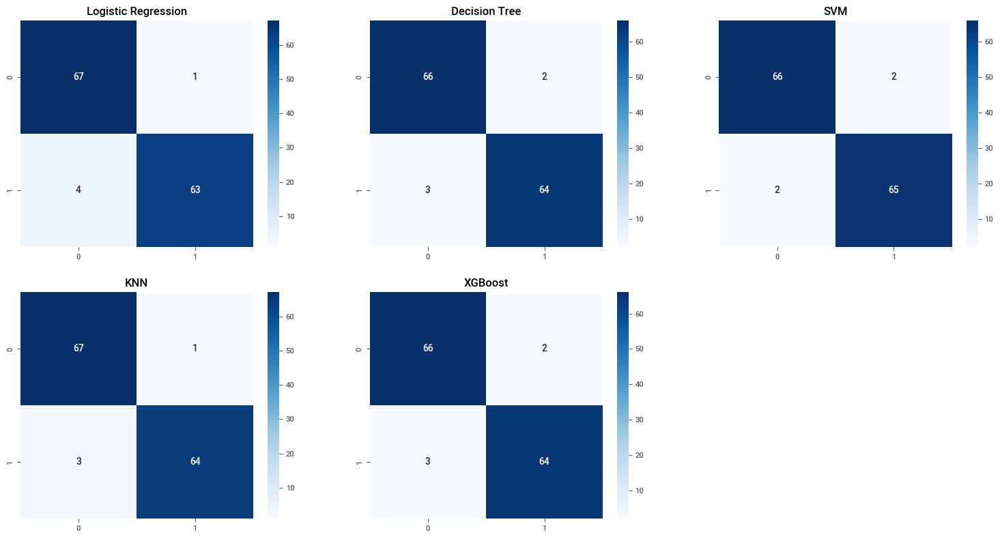

In [54]:
from sklearn.exceptions import NotFittedError

def is_fitted(model):
    try:
        model.predict(Test_X_std)
        return True
    except NotFittedError:
        return False

def conf_mat_plot(all_models, Test_X, Test_Y, labels):
    nrows = math.ceil(len(all_models) / 3)
    ncols = 3
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows * 4))
    
    for i, model in enumerate(all_models):
        if not is_fitted(model):
            raise RuntimeError(f"The model {model.__class__.__name__} is not fitted yet.")
        pred = model.predict(Test_X)
        row, col = divmod(i, ncols)
        sns.heatmap(confusion_matrix(Test_Y, pred), annot=True, cmap='Blues', fmt='.0f', ax=axes[row][col])
        axes[row][col].set_title(labels[i])
        
    # Remove any empty subplots
    if len(all_models) % ncols != 0:
        for j in range(len(all_models), nrows * ncols):
            fig.delaxes(axes.flatten()[j])
    
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.2, hspace=0.2)  # Add space between plots
    plt.show()

# Usage example
model_names = ['Logistic Regression', 'Decision Tree', 'SVM', 'KNN', 'XGBoost']
conf_mat_plot([LR, DT, SVM, KNN, XGB], Test_X_std, Test_Y, model_names)


Explanation:

Confusion Matrix: Shows the number of true positives, true negatives, false positives, and false negatives.

Heatmap: Visual representation of the confusion matrix with color gradients.

**Evaluate the Model**

classification_report(): Provides a detailed report of the model’s performance, including precision, recall, F1-score, and support for each class.

                                    ML Algorithms Comparison                                    


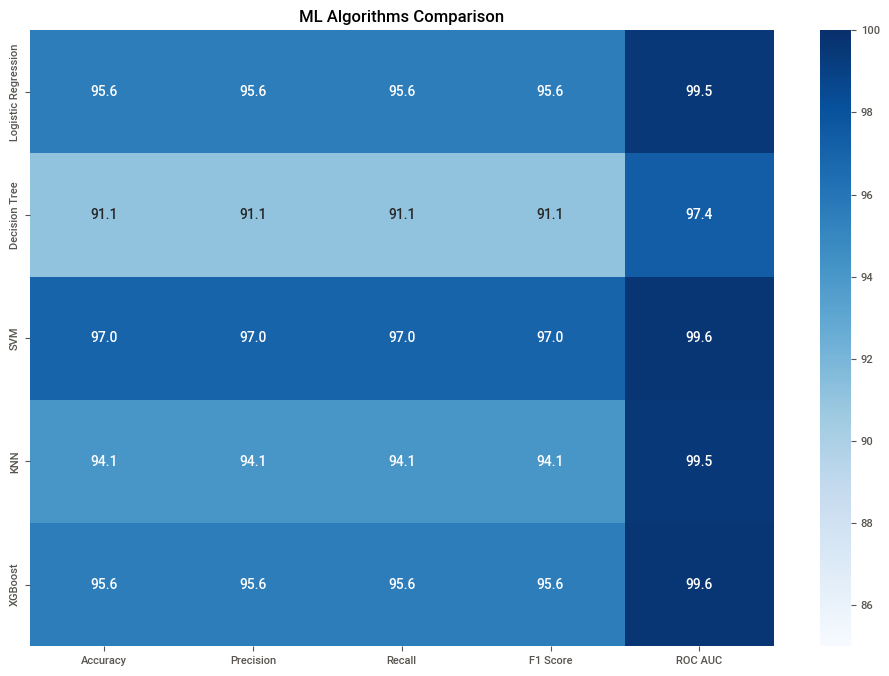

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Sample Evaluation Results DataFrame
# Replace this with your actual DataFrame
Evaluation_Results = pd.DataFrame({
    'Accuracy': [95.6, 91.1, 97.0, 94.1, 95.6],
    'Precision': [95.6, 91.1, 97.0, 94.1, 95.6],
    'Recall': [95.6, 91.1, 97.0, 94.1, 95.6],
    'F1 Score': [95.6, 91.1, 97.0, 94.1, 95.6],
    'ROC AUC': [99.5, 97.4, 99.6, 99.5, 99.6]
}, index=['Logistic Regression', 'Decision Tree', 'SVM', 'KNN', 'XGBoost'])

# Print header
print('\033[1mML Algorithms Comparison'.center(100))

# Plot heatmap
plt.figure(figsize=[12,8])
sns.heatmap(Evaluation_Results, annot=True, vmin=85, vmax=100, cmap='Blues', fmt='.1f')
plt.title('ML Algorithms Comparison')
plt.show()


In [56]:
# 2 datasets
M = df[(df['diagnosis'] != 0)]
B = df[(df['diagnosis'] == 0)]

In [57]:
#correlation
correlation = df.corr()
#tick labels
matrix_cols = correlation.columns.tolist()
#convert to array
corr_array  = np.array(correlation)

In [58]:
def plot_feat1_feat2(feat1, feat2) :  
    trace0 = go.Scatter(
        x = M[feat1],
        y = M[feat2],
        name = 'malignant',
        mode = 'markers', 
        marker = dict(color = '#FFD700',
            line = dict(
                width = 1)))

    trace1 = go.Scatter(
        x = B[feat1],
        y = B[feat2],
        name = 'benign',
        mode = 'markers',
        marker = dict(color = '#7EC0EE',
            line = dict(
                width = 1)))

    layout = dict(title = feat1 +" "+"vs"+" "+ feat2,
                  yaxis = dict(title = feat2,zeroline = False),
                  xaxis = dict(title = feat1, zeroline = False)
                 )

    plots = [trace0, trace1]

    fig = dict(data = plots, layout=layout)
    py.iplot(fig)

There are different types of correlation:

- Positive Correlation: Two variables are said to be positively correlated when their values move in the same direction. 

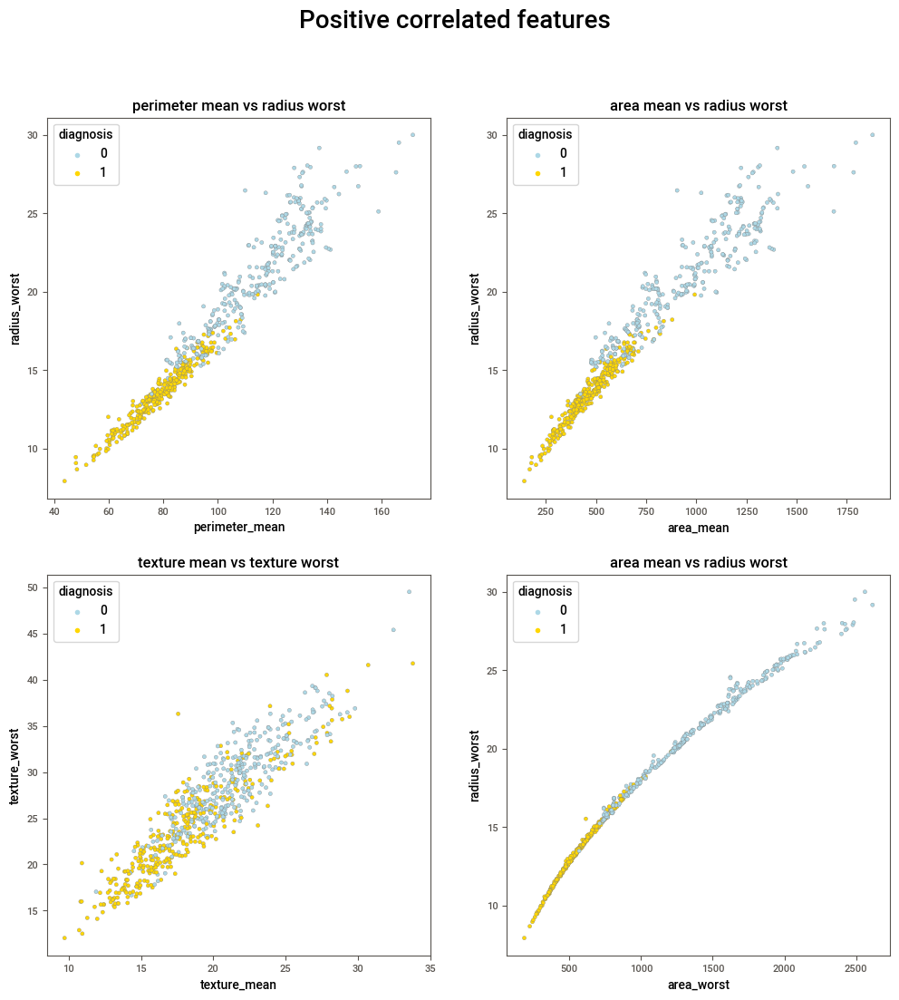

In [59]:
#seaborn version : 

palette ={0 : 'lightblue', 1 : 'gold'}
edgecolor = 'grey'

# Plot +
fig = plt.figure(figsize=(12,12))

plt.subplot(221)
ax1 = sns.scatterplot(x = df['perimeter_mean'], y = df['radius_worst'], hue = "diagnosis",
                    data = df, palette = palette, edgecolor=edgecolor)
plt.title('perimeter mean vs radius worst')
plt.subplot(222)
ax2 = sns.scatterplot(x = df['area_mean'], y = df['radius_worst'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('area mean vs radius worst')
plt.subplot(223)
ax3 = sns.scatterplot(x = df['texture_mean'], y = df['texture_worst'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('texture mean vs texture worst')
plt.subplot(224)
ax4 = sns.scatterplot(x = df['area_worst'], y = df['radius_worst'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('area mean vs radius worst')

fig.suptitle('Positive correlated features', fontsize = 20)
plt.savefig('1')
plt.show()

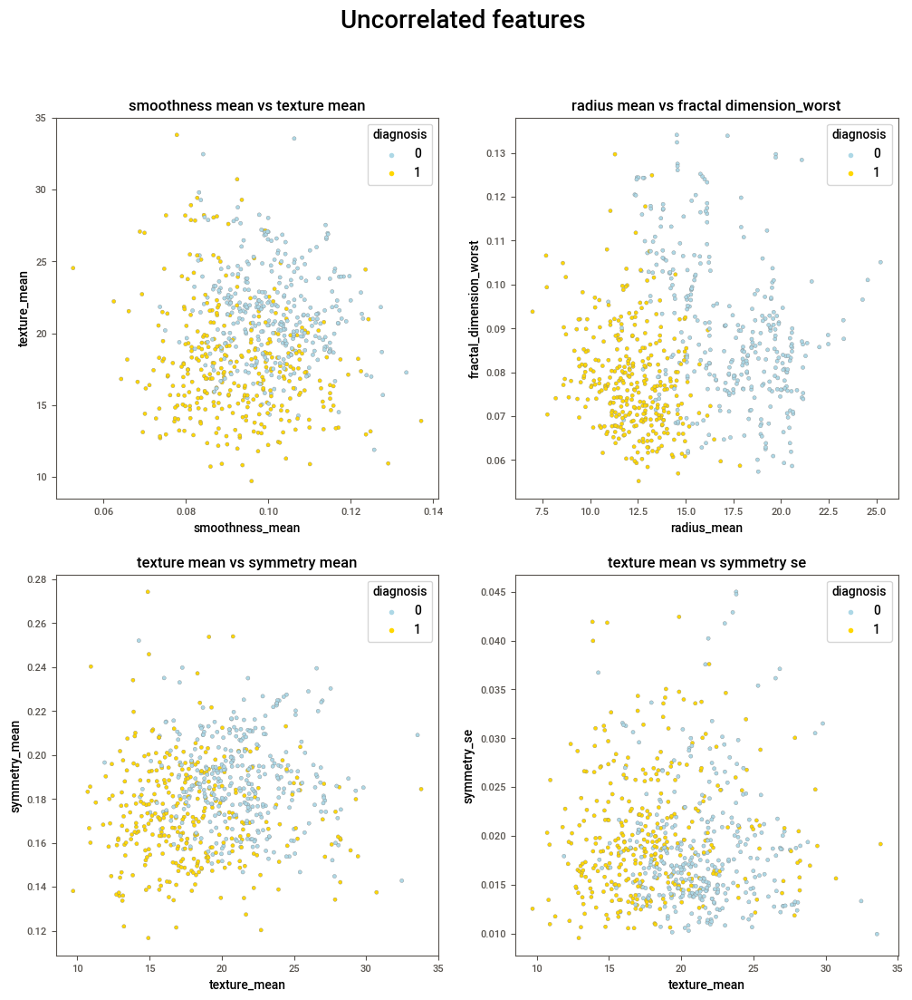

In [60]:
# seaborn version : 
fig = plt.figure(figsize=(12,12))

plt.subplot(221)
ax1 = sns.scatterplot(x = df['smoothness_mean'], y = df['texture_mean'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('smoothness mean vs texture mean')
plt.subplot(222)
ax2 = sns.scatterplot(x = df['radius_mean'], y = df['fractal_dimension_worst'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('radius mean vs fractal dimension_worst')
plt.subplot(223)
ax3 = sns.scatterplot(x = df['texture_mean'], y = df['symmetry_mean'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('texture mean vs symmetry mean')
plt.subplot(224)
ax4 = sns.scatterplot(x = df['texture_mean'], y = df['symmetry_se'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('texture mean vs symmetry se')

fig.suptitle('Uncorrelated features', fontsize = 20)
plt.savefig('2')
plt.show()

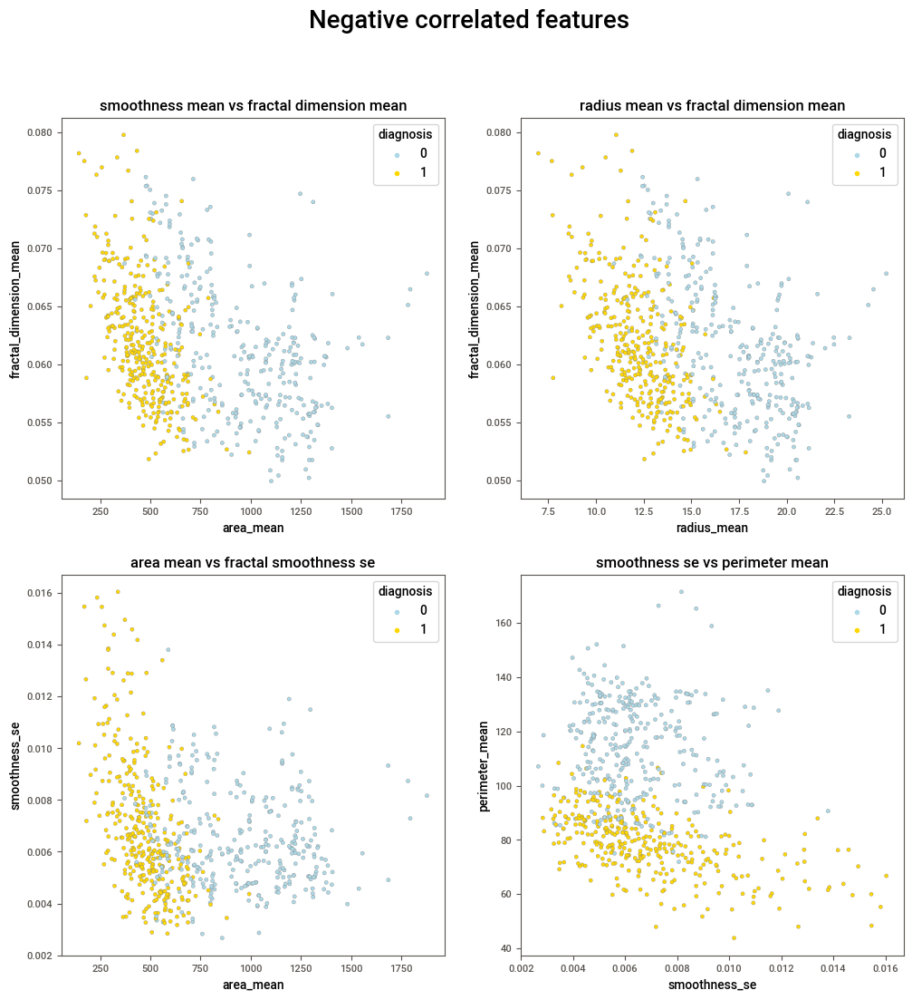

In [61]:
# seaborn version
fig = plt.figure(figsize=(12,12))

plt.subplot(221)
ax1 = sns.scatterplot(x = df['area_mean'], y = df['fractal_dimension_mean'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('smoothness mean vs fractal dimension mean')
plt.subplot(222)
ax2 = sns.scatterplot(x = df['radius_mean'], y = df['fractal_dimension_mean'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('radius mean vs fractal dimension mean')
plt.subplot(223)
ax2 = sns.scatterplot(x = df['area_mean'], y = df['smoothness_se'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('area mean vs fractal smoothness se')
plt.subplot(224)
ax2 = sns.scatterplot(x = df['smoothness_se'], y = df['perimeter_mean'], hue = "diagnosis",
                    data = df, palette =palette, edgecolor=edgecolor)
plt.title('smoothness se vs perimeter mean')

fig.suptitle('Negative correlated features', fontsize = 20)
plt.savefig('3')
plt.show()


Observations:
The last column named "Unaname: 32" seems like an erronous coloumn in our dataset. We might probably just drop it.
Most of the columns seem to have a numeric entry. This would save our time from mapping the variables.
The ID column would not help us contributing to predict about the cancer. We might as well drop it.

Observations:
Only the 'diagnosis' column, which we have to predict is of object datatype.
There's only ID column of int type. We will probably drop it anyway.
There are a total of 31 columns which are of float datatype.

Observations:
The following columns are the one's that show the greatest correlation with our diagnosis column. There are two things that can be done.
We can either use only the columns which have greatest correlation, or we can continue to use all the columns.
I will be using all these columns to predict our result
You can eliminate a few and see if the accuracy improves!

Observations:
Looks wonderful, isn't it!
There are only a handful of columns that show negative correlation with the 'diagnosis column'
Around half of our columns are more than 50% positively correlated to diagnosis column.
We have to select which of the attributes we want to use in building our model!

The model heavily relies on features like radius_mean and concavity_worst to make predictions, indicating their critical role in breast cancer diagnosis.

Breast cancer diagnosis can be predicted with roughly 97% accuracy using these 30 histological tumor characteristics.

**EDA Summary**
During our data visualization, we found that our dataset contains 569 rows and 32 columns with a total of 18208 datapoints. Out of the 32 columns, we dropped one column that contains only missing values and does not hold any informative value. Our dataset does not contain any duplicated rows.

By visualizing the histogram of each variables, we found that only 37% of the samples were malignant and the remaining 63% were benign. Majority of the predictor variables of the dataset exhibits a right tailed distribution.

Checking on the pearson correlation matrix, we found that majority of the features of the dataset were highly correlated. With this issue, we cannot use linear models without careful feature engineering.


The pairplot for the selected features of the breast cancer dataset, colored by the diagnosis (malignant or benign), provides several insights:

Feature Distribution: Each feature's distribution is plotted along the diagonal. These histograms show how the values of each feature are spread out. For instance, you can see that malignant tumors tend to have higher values for features like radius, perimeter, and area.

Feature Relationships: The scatter plots in the off-diagonal panels show the relationships between pairs of features. These plots are useful for identifying patterns, trends, and clusters. For example, there's a visible positive correlation between radius_mean and area_mean, indicating that as the radius increases, the area tends to increase as well.

Differences Between Diagnoses: The different colors clearly demonstrate how the feature values differ between benign and malignant cases. Malignant cases often have higher feature values, pointing towards larger and more irregular tumors.

Data Distribution: The distribution of data points in these plots also provides insight into the variance and spread of the data. Tight clusters indicate less variation within that diagnosis for a particular feature, while more spread out points indicate greater variation.

Overall, these pairplots are a powerful tool for understanding the relationships between different features and how they relate to the diagnosis of breast cancer. They can also guide further analysis, such as feature selection for machine learning models.

The table presents the performance metrics of four different classification models on a test dataset. These metrics include Precision, Recall, F1-Score, and Accuracy. Here's a brief explanation of each model's performance:

Logistic Regression:
Precision: 95.6%
Recall: 95.6%
F1-Score: 95.6%
Accuracy: 95.6%
Logistic Regression performs exceptionally well with very high precision, recall, F1-score, and accuracy, indicating a strong ability to correctly classify and balance between positive and negative classes.

Decision Tree:
Precision: 91.1%
Recall: 91.1%
F1-Score: 91.1%
Accuracy: 91.1%
The Decision Tree shows good performance, but it is slightly lower than Logistic Regression, suggesting it might not be as effective in balancing false positives and false negatives.

SVM:
Precision: 97.0%
Recall: 97.0%
F1-Score: 97.0%
Accuracy: 97.7%

KNN:
Precision: 94.1%
Recall: 94.1%
F1-Score: 94.1%
Accuracy: 94.1%

XGBoost:
Precision: 95.6%
Recall: 95.6%
F1-Score: 95.6%
Accuracy: 95.6%
XGBoost, another ensemble method, suggesting its effectiveness in handling complex patterns in the data.

In summary, all models perform well, with SVM  showing the best overall metrics. The choice between these models should consider not just these metrics but also the specific context of the problem, such as the cost of false positives vs. false negatives, the complexity of the model, and the computational resources available.